# **Analyzing Airbnb Trends Pricing & Super Host Patterns between LA and NYC**
Group Member: Yu(Kathy) Xu, Ruoxian(Roxy) Zhang, Fangzhou(Franco) Zheng, Manan Goel, Zicheng Wang


## **Table of Contents**
1. Executive Summary
2. Introduction & Motivation
3. Proposal
4. Data Cleaning
  - Summary for "Clean Phase" Section
5. Exploratory Data Analysis (EDA) & Questions
   - Data Structure and Basic Information
   - Preparation for Analysis
   - Q1. Validation Analysis
   - Q2. Range and Mean
   - Q3. Correlation Analysis
   - Q4. Price Analysis
   - Q5. Super_host Analysis
   - Q6. Type Distribution Analysis
   - Q7. Amenities Analysis
6. Conclusion
7. Challenges
8. References
9. Generative AI Disclosure


## **1 Executive Summary**

Our comparative analysis of Airbnb markets in Los Angeles (LA) and New York City (NYC) uncovered significant insights into pricing and Superhost trends. While both cities experienced booking growth from 2014 to 2022, LA demonstrated a faster rebound after the pandemic, potentially due to its diverse property offerings catering to evolving traveler preferences for entire homes and outdoor spaces. Furthermore, LA's price range spans a wider spectrum, accommodating luxury properties, whereas NYC's market exhibits greater price stability, concentrated within a mid-to-low range. While factors like accommodates and bathrooms positively correlate with price in both locations, LA's pricing is notably influenced by specific property and room types, suggesting a stronger emphasis on property characteristics. Superhost attainment hinges heavily on positive reviews in both cities, but LA Superhosts prioritize comprehensive amenities and prompt communication, whereas NYC Superhosts focus on delivering exceptional guest experiences, reflecting the competitive nature of the market. These insights into city-specific preferences and market dynamics provide valuable guidance for hosts and travelers navigating these vibrant Airbnb landscapes.

## **2 Introduction & Motivation**



**Introduction**

This project focuses on analyzing Airbnb datasets from Los Angeles and New York City. The primary objectives are to evaluate price trends, identify key factors influencing pricing, examine the differences in pricing patterns between these two major cities, and explore the elements that contribute to achieving super-host status. Additionally, we will investigate the variations in room types across the regions, offering a comprehensive comparison of the Airbnb markets in both cities. Through this analysis, we aim to uncover valuable insights for hosts and travelers alike. Understanding pricing trends and host performance metrics will facilitate data-driven decision-making regarding Airbnb listings.

The project aims to analyze the Airbnb datasets of Los Angeles and New York City to assess pricing patterns, the influencing factors of superhosts, and the differences in Airbnb types across regions. We will:

- Identify the influencing factors of superhosts in both cities and compare the results to evaluate their commonalities and differences.
- Identify the most important factors affecting Airbnb prices in both cities and compare the results to evaluate their commonalities and differences.
- Examine the distribution of room types across regions, compare them, and identify the differences between the two cities.
- Visualize the distribution of mutiple types and provide a visual representation of the supervised learning models.

**Motivation**

Airbnb significantly impacts the U.S. house renting and tourism industry. To stay competitive, understanding the factors behind super host success and room price differences is essential. This project aims to uncover these insights, enabling Airbnb to better target potential super hosts, refine its location-based offerings, and help new users make informed decisions, ultimately improving the platform’s strategic planning and user satisfaction.



## **3 Proposal**

This project focuses on the comprehensive analysis of Airbnb market dynamics in Los Angeles (LA) and New York City (NYC), utilizing large datasets sourced from [InsideAirbnb.com](https://InsideAirbnb.com) and [Kaggle](https://www.kaggle.com/). The primary objective is to explore and compare the trends, pricing strategies, and distribution of Airbnb listings in these two major cities, offering insights into the differences in market behavior. By leveraging extensive data on listing details, pricing, occupancy rates, and neighborhood characteristics, we aim to uncover key patterns that can inform decision-making for hosts, potential guests, and even policymakers.

**Data Source**
1. Inside Airbnb: Get the data per city. These datasets give us two cities' Airbnb listings, one is LA(West Coast) and one is NYC(East Coast) in 2023. ([link](https://insideairbnb.com/get-the-data/))
2. Inside Airbnb: Get the data. This dataset is generated using inside Airbnb dataset and gives us the total information about Airbnb listings in the United States in 2023. ([link](https://www.kaggle.com/datasets/kritikseth/us-airbnb-open-data?select=AB_US_2023.csv))

## **4 Data Cleaning**

**Input the Data**

In [1]:
import pandas as pd
#import columns form LA_airbnb
la_airbnb = pd.read_csv("/content/LA_airbnb_122023.csv")

columns_la = ['id', 'host_id', 'host_name', 'host_response_time', 'host_response_rate', 'host_is_superhost', 'host_neighbourhood',
           'neighbourhood_cleansed', 'property_type', 'room_type', 'accommodates', 'bathrooms_text', 'beds', 'price',
           'minimum_nights', 'maximum_nights', 'minimum_nights_avg_ntm', 'has_availability',
           'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews_ltm',
           'review_scores_rating', 'instant_bookable', 'reviews_per_month', 'amenities', 'latitude', 'longitude']

df_la = pd.DataFrame(columns=columns_la)

df_la = la_airbnb[columns_la]
df_la.head()


#import columns form NYC_airbnb
nyc_airbnb = pd.read_csv("/content/NYC_airbnb_122023.csv")

columns_nyc = ['id', 'host_id', 'host_name', 'host_response_time', 'host_response_rate', 'host_is_superhost', 'host_neighbourhood',
           'neighbourhood_cleansed', 'property_type', 'room_type', 'accommodates', 'bathrooms_text', 'beds', 'price',
           'minimum_nights', 'maximum_nights', 'minimum_nights_avg_ntm', 'has_availability',
           'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews_ltm',
           'review_scores_rating', 'instant_bookable', 'reviews_per_month', 'amenities', 'latitude', 'longitude']

df_nyc = pd.DataFrame(columns=columns_nyc)

df_nyc = nyc_airbnb[columns_nyc]
df_nyc.head()

#import columns from AB_US_2023
df_us_2023 = pd.read_csv("/content/AB_US_2023.csv")
columns_US2023 = ['id', "host_id","host_name", "neighbourhood", "city"]
df_us2023 = pd.DataFrame(columns=columns_US2023)
df_us2023 = df_us_2023[columns_US2023]
df_us2023.head()

#filter:'LA' & 'NYC'
df_us2023 = df_us2023[df_us2023['city'].isin(['Los Angeles','New York City'])]
df_us2023.head()

<ipython-input-1-9fa7de184768>:32: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df_us_2023 = pd.read_csv("/content/AB_US_2023.csv")


,id,host_id,host_name,neighbourhood,city
24260,770565020594037590,30603612,Yamileth,Pomona,Los Angeles
24261,777451666060243581,490709958,Dana,Castaic Canyons,Los Angeles
24262,698097753730921190,444692513,Hanna,Pomona,Los Angeles
24263,13063118,41736985,Beth,Rancho Palos Verdes,Los Angeles
24264,39337076,208375458,Jae,Rancho Palos Verdes,Los Angeles


In [ ]:
#data cleaning for NA
df_la = df_la.dropna(how='any')
df_nyc = df_nyc.dropna(how='any')

we use dropna(how='any') to remove any rows containing missing values in df_la and df_nyc. We picked up all the columns we need from the dataset, any missing will affect our analysis.

In [ ]:
#Extracting numbers from the 'bathrooms_text' column
df_la['bathrooms'] = df_la['bathrooms_text'].str.extract('(\d+\.?\d*)')
df_nyc['bathrooms'] = df_nyc['bathrooms_text'].str.extract('(\d+\.?\d*)')

#Convert data type from string to float
df_la['bathrooms'] = df_la['bathrooms'].astype(float)
df_nyc['bathrooms'] = df_nyc['bathrooms'].astype(float)
df_la.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21120 entries, 2 to 45499
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      21120 non-null  int64  
 1   host_id                 21120 non-null  int64  
 2   host_name               21120 non-null  object 
 3   host_response_time      21120 non-null  object 
 4   host_response_rate      21120 non-null  float64
 5   host_is_superhost       21120 non-null  object 
 6   host_neighbourhood      21120 non-null  object 
 7   neighbourhood_cleansed  21120 non-null  object 
 8   property_type           21120 non-null  object 
 9   room_type               21120 non-null  object 
 10  accommodates            21120 non-null  int64  
 11  bathrooms_text          21120 non-null  object 
 12  beds                    21120 non-null  float64
 13  price                   21120 non-null  object 
 14  minimum_nights          21120 non-null  int

<ipython-input-3-954898498a76>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_la['bathrooms'] = df_la['bathrooms_text'].str.extract('(\d+\.?\d*)')
<ipython-input-3-954898498a76>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nyc['bathrooms'] = df_nyc['bathrooms_text'].str.extract('(\d+\.?\d*)')
<ipython-input-3-954898498a76>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

We use str.extract('(\d+\.?\d*)') to extract numerical values from the bathrooms_text column and store them in a new column, bathrooms.Then we convert the bathrooms column to a float using astype(float).

In [ ]:
df_la['host_response_rate'] = df_la['host_response_rate'].astype(str).str.rstrip('%')

# Convert to numeric, setting errors='coerce' to handle non-numeric values (like NaNs)
df_la['host_response_rate'] = pd.to_numeric(df_la['host_response_rate'], errors='coerce')

df_nyc['host_response_rate'] = df_nyc['host_response_rate'].astype(str).str.rstrip('%')

# Convert to numeric, setting errors='coerce' to handle non-numeric values (like NaNs)
df_nyc['host_response_rate'] = pd.to_numeric(df_nyc['host_response_rate'], errors='coerce')
#df_la['host_response_rate'] = df_la['host_response_rate'].str.rstrip('%').astype(float)
#df_nyc['host_response_rate'] = df_nyc['host_response_rate'].str.rstrip('%').astype(float)


<ipython-input-4-9456af8cc5c7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_la['host_response_rate'] = df_la['host_response_rate'].astype(str).str.rstrip('%')
<ipython-input-4-9456af8cc5c7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_la['host_response_rate'] = pd.to_numeric(df_la['host_response_rate'], errors='coerce')
<ipython-input-4-9456af8cc5c7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

For the host_response_rate column, we first remove the percentage sign using str.rstrip('%'). Then, we convert the column to a numeric type using pd.to_numeric(errors='coerce'), setting any non-numeric values to NaN.

In [ ]:
df_la['price'] = df_la['price'].str.replace('$', '').str.replace(',', '').astype(float)
df_nyc['price'] = df_nyc['price'].str.replace('$', '').str.replace(',', '').astype(float)

We first remove the dollar sign and commas using str.replace('$', '').str.replace(',', ''), and then convert the column to a float.

In [ ]:
#convert t & f to 1 & 0
df_la['instant_bookable'] = df_la['instant_bookable'].map({'t': 1, 'f': 0})
df_la['host_is_superhost'] = df_la['host_is_superhost'].map({'t': 1, 'f': 0})
df_la['has_availability'] = df_la['has_availability'].map({'t': 1, 'f': 0})

df_nyc['instant_bookable'] = df_nyc['instant_bookable'].map({'t': 1, 'f': 0})
df_nyc['host_is_superhost'] = df_nyc['host_is_superhost'].map({'t': 1, 'f': 0})
df_nyc['has_availability'] = df_nyc['has_availability'].map({'t': 1, 'f': 0})

For Boolean columns like instant_bookable, host_is_superhost, and has_availability, we use map({'t': 1, 'f': 0}) to map ‘t’ and ‘f’ to 1 and 0, respectively.

In [ ]:
#create a new column named 'average_avaliability'
df_la['average_avaliability'] = df_la[['availability_30', 'availability_60', 'availability_90', 'availability_365']].mean(axis=1)
df_nyc['average_avaliability'] = df_nyc[['availability_30', 'availability_60', 'availability_90', 'availability_365']].mean(axis=1)

We creates a new column called average_availability in both df_la and df_nyc. This column is generated by calculating the mean across four columns: availability_30, availability_60, availability_90, and availability_365.

In [ ]:
#drop duplicates in both dataset
df_la = df_la.drop_duplicates(subset=['id', 'host_id'])
df_nyc = df_nyc.drop_duplicates(subset=['id', 'host_id'])

we use 	.drop_duplicates(subset=[‘id’, ‘host_id']) to removes any duplicate rows where the id and host_id columns have the same values.

In [ ]:
df_us2023.head(5)

,id,host_id,host_name,neighbourhood,city
24260,770565020594037590,30603612,Yamileth,Pomona,Los Angeles
24261,777451666060243581,490709958,Dana,Castaic Canyons,Los Angeles
24262,698097753730921190,444692513,Hanna,Pomona,Los Angeles
24263,13063118,41736985,Beth,Rancho Palos Verdes,Los Angeles
24264,39337076,208375458,Jae,Rancho Palos Verdes,Los Angeles


### **Summary for "Clean Phase" Section**

To ensure the integrity of our data, we start by using the dropna(how='any') function on both df_la and df_nyc. This step removes any rows containing missing values across all columns. By doing this, we ensure that all subsequent operations are performed on complete data, which helps us avoid potential issues with missing values later in our analysis.

Next, we use str.extract('(\d+\.?\d*)') to extract numerical values from the bathrooms_text column. After extracting the bathroom numbers, we convert the bathrooms column from a string to a float using the astype(float) function. This step ensures that the values in this column are treated as numbers, enabling us to perform mathematical operations and calculations on the bathroom data.

We also clean the host_response_rate column by removing the percentage signs using the str.rstrip('%') function. Then, we convert the resulting strings into numerical values with pd.to_numeric(errors='coerce'), which handles any non-numeric values by converting them to NaN. This allows us to treat the host_response_rate as a numeric column, ready for calculations or comparisons.
For the price column, we remove any dollar signs and commas using str.replace('$', '').str.replace(',', ''), and then we convert the cleaned values to floats with astype(float). By doing this, the price data is in a numeric format that can be used for analysis, such as calculating average prices or comparing listings.

For Boolean columns, we convert the Boolean values in columns like instant_bookable, host_is_superhost, and has_availability to binary values using the map({'t': 1, 'f': 0}) function. This maps 't' (true) to 1 and 'f' (false) to 0, making these columns easier to work with in numerical or logical operations, especially in performing binary analysis.

To summarize the availability of each listing across multiple time periods, we create a new column called average_availability in both df_la and df_nyc. We calculate this by taking the mean of four different availability columns: availabi1lity_30, availability_60, availability_90, and availability_365. By using the mean(axis=1) function, we calculate the average availability for each row, or listing, across these time periods. This new column provides us with a single metric that captures how available a listing is over various time frames and simplifies future analyses that might involve availability trends.

After that, we address potential duplicate listings in our datasets by using the drop_duplicates(subset=['id', 'host_id']) function ensuring that we only retain unique listings based on the combination of id and host_id columns and prevent over-representation of certain listings or hosts in subsequent analyses.

## **5 Exploratory Data Analysis (EDA) & Questions**


### **Data Structure and Basic Information**

In [ ]:
print(la_airbnb.info())
print(nyc_airbnb.info())
print(df_us_2023.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45591 entries, 0 to 45590
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            45591 non-null  int64  
 1   listing_url                                   45591 non-null  object 
 2   scrape_id                                     45591 non-null  int64  
 3   last_scraped                                  45591 non-null  int64  
 4   source                                        45591 non-null  object 
 5   name                                          45591 non-null  object 
 6   description                                   0 non-null      float64
 7   neighborhood_overview                         25200 non-null  object 
 8   picture_url                                   45591 non-null  object 
 9   host_id                                       45591 non-null 

Original Dataset:

LA Original Dataset
- Total rows: 45591
- Total Columns: 75
- Data types: 19 columns are floats, 21 columns are integers, and 35 columns are strings

NYC Original Dataset
- Total rows: 39627
- Total Columns: 75
- Data types: 19 columns are floats, 21 columns are integers, and 35 columns are strings

US_2023 Original Dataset
- Total rows: 232147
- Total Columns: 18
- Data types: 3 columns are floats, 8 columns are integers, and 7 columns are strings

In [ ]:
# every one in the cell should be visible
print(df_la.info())
print(df_nyc.info())
print(df_us2023.info())

<class 'pandas.core.frame.DataFrame'>
Index: 21120 entries, 2 to 45499
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      21120 non-null  int64  
 1   host_id                 21120 non-null  int64  
 2   host_name               21120 non-null  object 
 3   host_response_time      21120 non-null  object 
 4   host_response_rate      21120 non-null  float64
 5   host_is_superhost       21120 non-null  int64  
 6   host_neighbourhood      21120 non-null  object 
 7   neighbourhood_cleansed  21120 non-null  object 
 8   property_type           21120 non-null  object 
 9   room_type               21120 non-null  object 
 10  accommodates            21120 non-null  int64  
 11  bathrooms_text          21120 non-null  object 
 12  beds                    21120 non-null  float64
 13  price                   21120 non-null  float64
 14  minimum_nights          21120 non-null  int

Clean Dataset:
LA Clean Dataset
- Total rows: 21120
- Total Columns: 29
- Data types: 7 columns are floats, 10 columns are integers, and 12 columns are strings

NYC Clean Dataset
- Total rows: 12966
- Total Columns: 29
- Data types: 7 columns are floats, 10 columns are integers, and 12 columns are strings

US_2023 Clean Dataset
- Total rows: 85382
- Total Columns: 5
- Data types: 2 columns are integers, and 3 columns are strings

In [ ]:
print(df_la.isnull().sum())
print(df_nyc.isnull().sum())
print(df_us2023.isnull().sum())

id                         0
host_id                    0
host_name                  0
host_response_time         0
host_response_rate         0
host_is_superhost          0
host_neighbourhood         0
neighbourhood_cleansed     0
property_type              0
room_type                  0
accommodates               0
bathrooms_text             0
beds                       0
price                      0
minimum_nights             0
maximum_nights             0
minimum_nights_avg_ntm     0
has_availability           0
availability_30            0
availability_60            0
availability_90            0
availability_365           0
number_of_reviews_ltm      0
review_scores_rating       0
instant_bookable           0
reviews_per_month          0
amenities                  0
latitude                   0
longitude                  0
bathrooms                 41
average_avaliability       0
dtype: int64
id                         0
host_id                    0
host_name                  0
h

Missing Values:

LA Dataset:
There are 8 columns that contain NaN, "host_response_time", "host_response_rate", "host_is_superhost", "host_neighbourhood", "bathrooms_text", "beds", "review_scores_rating", and"reviews_per_month"

NYC Dataset:
There are 9 columns that contain NaN, "host_name", "host_response_time", "host_response_rate","host_is_superhost", "host_neighbourhood", "bathrooms_text", "beds","review_scores_rating", and"reviews_per_month"

US_2023 Dataset:
There is 1 column that contain NaN, "host_name"

After cleaning the data, we did some exploratories towards data. According to the information shown above, after cleaning, the data has shrinked to a large extent. This means the original data is not a cleaned data and contains many missing values as well as duplicates. After choosing the columns needed for this project, the subset of the data still contains NaN values, in all three sub datesets, which might be influential toward the results. However, as some of the missing values might be needed for research, we still keep the NaN in the dataset.

In [ ]:
df_la['City'] = 'LA'
df_nyc['City'] = 'NYC'
df_combined = pd.concat([df_la, df_nyc])

**Top 10 Cities by Unique Host Listings in USA**

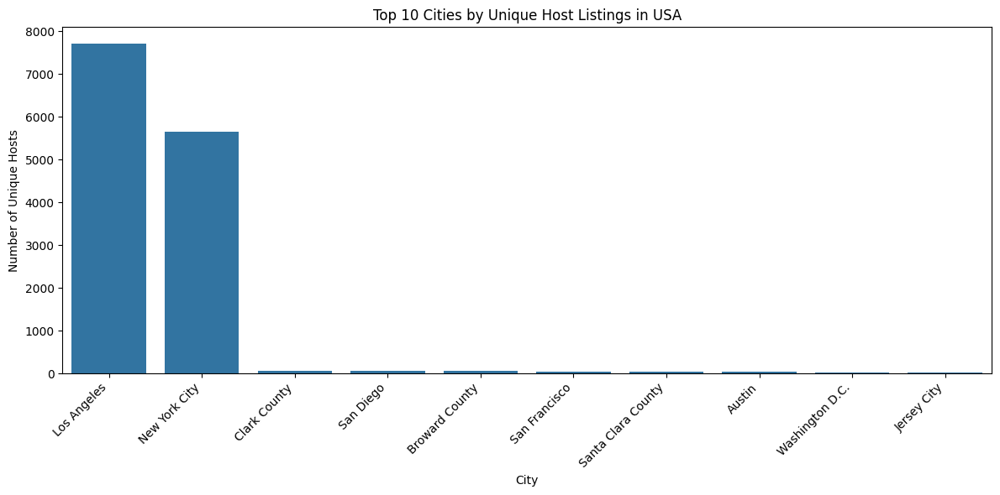

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Merge the datasets
merged_df = pd.concat([df_la, df_nyc])
us_hosts = df_us_2023[['host_id', 'city']].drop_duplicates()
merged_data = pd.merge(merged_df, us_hosts, on='host_id', how='left')

# Calculate unique host listings per city
host_listings = merged_data.groupby('city')['host_id'].nunique().reset_index()
top_10_cities = host_listings.sort_values(by='host_id', ascending=False).head(10)

# Visualize the results
plt.figure(figsize=(12, 6))
sns.barplot(x='city', y='host_id', data=top_10_cities)
plt.title('Top 10 Cities by Unique Host Listings in USA')
plt.xlabel('City')
plt.ylabel('Number of Unique Hosts')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

*Figure 1. Top 10 Cities by Unique Host Listings in USA*

Los Angeles and New York City have the highest number of unique Airbnb hosts, far surpassing other cities in the USA. This highlights their significance as major Airbnb markets and indicates a greater concentration of hosts in these metropolitan areas.

**Booking Trend in LA and NYC (from 2014 to 2022)**

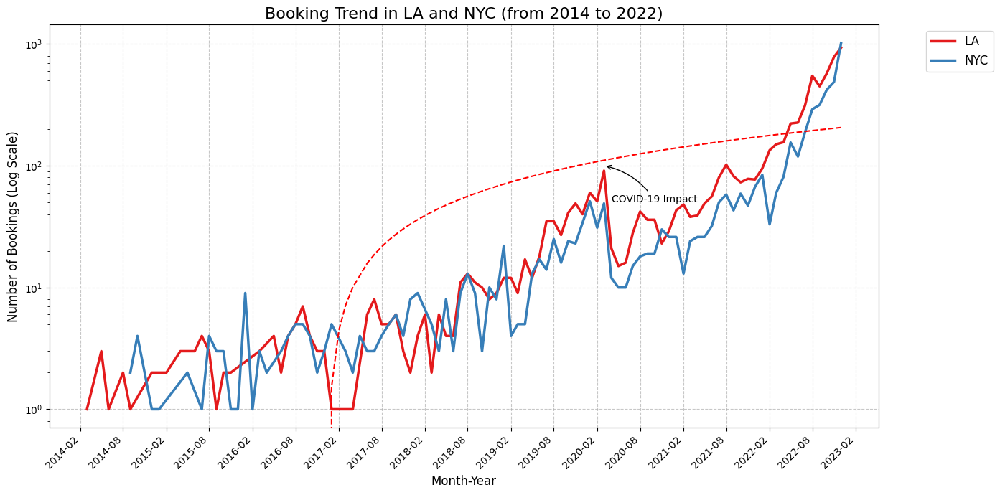

In [ ]:
import matplotlib.dates as mdates
from numpy import polyfit


# 1. Data Preparation
df_la['City'] = 'LA'
df_nyc['City'] = 'NYC'
df_combined = pd.concat([df_la, df_nyc])
merged_df = pd.merge(df_combined, df_us_2023, on='id', how='left')

merged_df['last_review_date'] = pd.to_datetime(merged_df['last_review'])
merged_df['month_year'] = merged_df['last_review_date'].dt.to_period('M')

bookings_by_month = merged_df.groupby(['City', 'month_year'])['id'].count().reset_index()
bookings_by_month = bookings_by_month.rename(columns={'id': 'booking_count'})

bookings_by_month['month_year'] = bookings_by_month['month_year'].dt.to_timestamp()

# Filter data from 2014 to December 2022
bookings_by_month = bookings_by_month[
    (bookings_by_month['month_year'] >= pd.Timestamp('2014-01-01')) &
    (bookings_by_month['month_year'] <= pd.Timestamp('2022-12-31'))
]

# 2. Chart Creation
plt.figure(figsize=(14, 7))
ax = sns.lineplot(x='month_year', y='booking_count', hue='City', data=bookings_by_month,
                  linewidth=2.5, palette="Set1")

plt.title('Booking Trend in LA and NYC (from 2014 to 2022)', fontsize=16)
plt.xlabel('Month-Year', fontsize=12)
plt.ylabel('Number of Bookings (Log Scale)', fontsize=12)

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))  # Adjusted tick interval
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45, ha='right', fontsize=10)

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.yscale('log')

# Annotations and Highlighting
plt.annotate('COVID-19 Impact', xy=(pd.Timestamp('2020-03-01'), 100),
             xytext=(pd.Timestamp('2020-04-01'), 50),
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2'))

# plt.axvspan(pd.Timestamp('2019-07-01'), pd.Timestamp('2019-09-30'),
#             color='yellow', alpha=0.2, label='Peak Season')


la_data = bookings_by_month[bookings_by_month['City'] == 'LA']
x = mdates.date2num(la_data['month_year'])
y = la_data['booking_count']
coefficients = polyfit(x, y, 1)
trendline = coefficients[0] * x + coefficients[1]
plt.plot(la_data['month_year'], trendline, color='red', linestyle='--', label='LA Trendline')



plt.tight_layout()
plt.show()

*Figure 2. Booking Trend in LA and NYC (from 2014 to 2022)*

**Overall**: Both LA and NYC show increasing Airbnb bookings from 2014 to 2022, with a dip in 2020 due to the pandemic. Both cities have recovered, exceeding pre-pandemic levels.

**City Comparison**: LA consistently has more bookings than NYC, although the gap narrowed in 2022.

**Seasonality**: Bookings are higher in warmer months, especially in LA.
COVID-19 Impact: Bookings dropped in early 2020, but LA rebounded quickly, while NYC's recovery was slower.


**Price Outlier Detection by City**

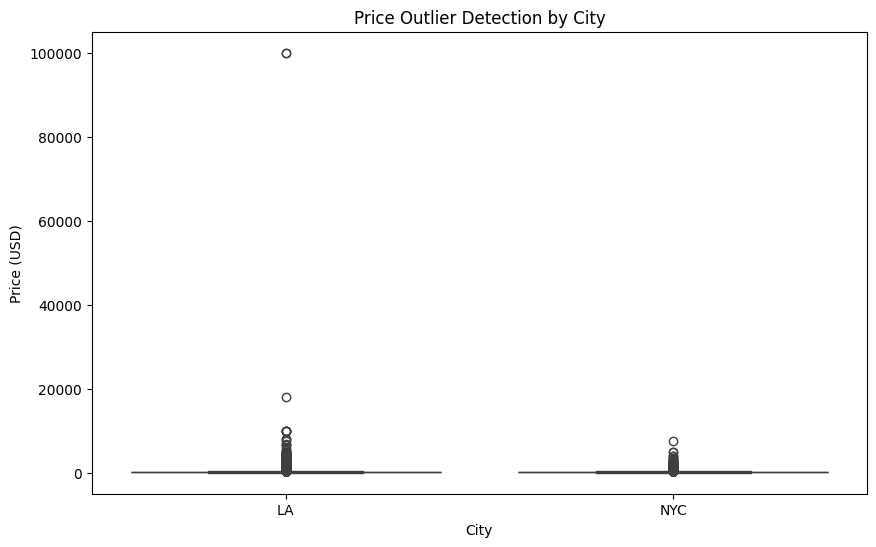

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_combined, x='City', y='price')
plt.title('Price Outlier Detection by City')
plt.xlabel('City')
plt.ylabel('Price (USD)')
plt.show()

*Figure 3. Price Outlier Detection*

LA shows a wider price range and more outliers, indicating a diverse market with high-end properties.

NYC has a more concentrated price range with fewer outliers, suggesting a stable market.

Outliers in LA are likely due to luxury properties, impacting overall price distribution.

Outliers in NYC are less frequent, indicating a more homogeneous market.

### **Preparation for Analysis**

In [ ]:
# Validate the hosts for LA

# Subset the us2023 datset to select rows with city == LA
df_us2023_LA = df_us2023.loc[df_us2023["city"] == "Los Angeles" ]
# Change name of the column for matching in the next step
df_us2023_LA.rename(columns={'neighbourhood': 'host_neighbourhood'}, inplace=True)
# Drop the columns as the city has been selected
df_us2023_LA.drop(columns=['city'], inplace=True)
# Merge two tables together to validate
merged_df_la = df_us2023_LA.merge(df_la, on = ["id", "host_id", "host_name", "host_neighbourhood"], how = "inner")

<ipython-input-17-fe7729ee811d>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_us2023_LA.rename(columns={'neighbourhood': 'host_neighbourhood'}, inplace=True)
<ipython-input-17-fe7729ee811d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_us2023_LA.drop(columns=['city'], inplace=True)


This cell is for validation of host for LA using US2023 dataset. By using for vairables needed to be matched in both datasets, the validation is stronger than merging datasets which only use one identifier.

In [ ]:
# Validate the hosts for NYC

# Subset the us2023 datset to select rows with city == LA
df_us2023_NYC = df_us2023.loc[df_us2023["city"] == "New York City" ]
# Change name of the column for matching in the next step
df_us2023_NYC.rename(columns={'neighbourhood': 'host_neighbourhood'}, inplace=True)
# Drop the columns as the city has been selected
df_us2023_NYC.drop(columns=['city'], inplace=True)
# Merge two tables together to validate
merged_df_nyc = df_us2023_NYC.merge(df_nyc, on = ["id", "host_id", "host_name", "host_neighbourhood"], how = "inner")

<ipython-input-18-89ea0a23aa60>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_us2023_NYC.rename(columns={'neighbourhood': 'host_neighbourhood'}, inplace=True)
<ipython-input-18-89ea0a23aa60>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_us2023_NYC.drop(columns=['city'], inplace=True)


Repeat the operation for NYC as did in LA dataset.

In [ ]:
import numpy as np

### **Q1 Validation Analysis**
How many validate hosts after validation for each city?

In [ ]:
print(merged_df_la.shape[0])
print(merged_df_nyc.shape[0])

6338
5560


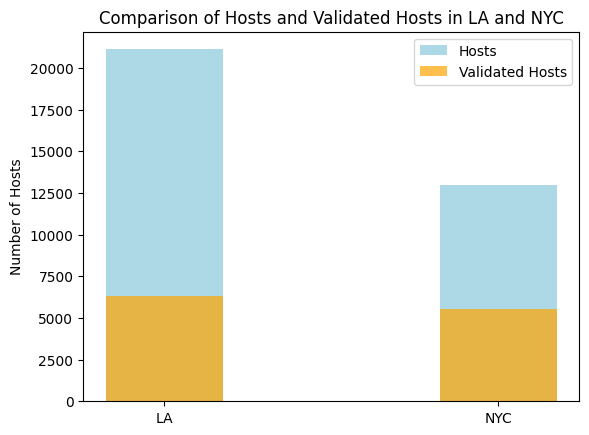

In [ ]:
# Define data for hosts and validated hosts for LA and NYC
hosts_la = len(df_la)
hosts_nyc = len(df_nyc)
validated_hosts_la = merged_df_la.shape[0]
validated_hosts_nyc = merged_df_nyc.shape[0]

# Create labels for the cities
cities = ['LA', 'NYC']

# Create data for plotting that shows the comparsion of effect after validation
hosts = [hosts_la, hosts_nyc]
validated_hosts = [validated_hosts_la, validated_hosts_nyc]

# Set the width of the bars
width = 0.35

# Create the bar positions
x = np.arange(len(cities))
fig, ax = plt.subplots()
rects1 = ax.bar(x, hosts, width, label='Hosts', color='lightblue')

# For overlapping effect
rects2 = ax.bar(x, validated_hosts, width, label='Validated Hosts', color='orange', alpha=0.7)
# Add labels
ax.set_ylabel('Number of Hosts')
ax.set_title('Comparison of Hosts and Validated Hosts in LA and NYC')
ax.set_xticks(x)
ax.set_xticklabels(cities)
ax.legend()

plt.show()

*Figure 4. Comparison of Hosts and Validated Hosts*

Compared to New York City, Los Angeles has a significantly higher number of validated Airbnb hosts. In New York, short-term rentals of less than 30 days are only permitted if the host is present in the property, which reduces the availability of entire home listings. This, combined with the high cost of housing in NYC, limits the number of people who own properties that can be rented out on Airbnb. In contrast, Los Angeles offers more opportunities for homeownership, and the city’s larger geographic area and the prevalence of single-family homes provide more properties suitable for short-term rentals. Additionally, LA’s warm climate attracts tourists year-round, which leads to a more consistent demand for short-term rentals, unlike New York, where tourism is more seasonal.

Moreover, the reason why this data decreases after validation might be that some hosts become inactive after registering on Airbnb, and some properties may no longer belong to them after a certain period.

Overall, LA’s favorable conditions contribute to a greater variety of accommodation options for travelers compared to New York City.

### **Q2 Range and Mean**
What is the highest price and lowest price for two cities? How about the price range? How about mean price?

In [ ]:
high_la = merged_df_la['price'].max()
print("Highest price in LA:", high_la)

low_la = merged_df_la['price'].min()
print("Lowest price in LA:", low_la)

range_la = high_la - low_la
print("Range of price in LA:", range_la)

high_nyc = merged_df_nyc['price'].max()
print("Highest price in NYC:",high_nyc)

low_nyc = merged_df_nyc['price'].min()
print("Lowest price in NYC:",low_nyc)

range_nyc = high_nyc - low_nyc
print("Range of price in NYC:",range_nyc)

mean_la = merged_df_la['price'].mean()
print("Mean price in LA:",mean_la)

mean_nyc = merged_df_nyc['price'].mean()
print("Mean price in NYC:",mean_nyc)

median_la = merged_df_la['price'].median()
print("Median price in LA:", median_la)

median_nyc = merged_df_nyc['price'].median()
print("Median price in NYC:", median_nyc)

Highest price in LA: 99999.0
Lowest price in LA: 10.0
Range of price in LA: 99989.0
Highest price in NYC: 4000.0
Lowest price in NYC: 10.0
Range of price in NYC: 3990.0
Mean price in LA: 227.70432313032504
Mean price in NYC: 169.6044964028777
Median price in LA: 135.0
Median price in NYC: 123.0


Entire Homes/Apartments: LA has a much higher maximum price for entire homes, likely due to luxury properties in high-demand areas like Beverly Hills ($99999). These several outliers in this data set that is so large that may significantly affect the price in Los Angeles. For NYC, though the price is high, but it has fewer ultra-luxury homes, that means the price is more concentrated.

### **Q3 Correlation Analysis**
What variables are correlated with each other? What variables are correlated with price?

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

df_encoded = df_la.copy()


for col in df_encoded.columns:

    if df_encoded[col].dtype == 'object':

        df_encoded[col] = le.fit_transform(df_encoded[col])

numerical_df = df_encoded.select_dtypes(include=['number'])
corr = numerical_df.corr()
plt.figure(figsize=(24, 21), dpi=500)
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [ ]:
le = LabelEncoder()
df_encoded = df_nyc.copy()


for col in df_encoded.columns:
    if df_encoded[col].dtype == 'object':
        df_encoded[col] = le.fit_transform(df_encoded[col])

numerical_df = df_encoded.select_dtypes(include=['number'])
corr = numerical_df.corr()
plt.figure(figsize=(24, 21), dpi=500)
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

*Figure 5. Heatmap for variable correlation*

In Los Angeles

Positively correlation is between:
- “Id” and “host id”
- “host respond time” and “host respond rate”
- “host neighborhood” and “neighborhood cleansed”
- “beds” and “accommodates”
- “minimum nights avg ntm” and “minimum night”
- “room type” and “property type”
- “availability 30” and “availability 60”, “availability 90”
- “availability 60” and “availability 90”
- “availability 60”,” availability 90”,” availability 365” and “average availability”
- “reviews per month” and “numbers of reviews itm”

Negatively correlation is between:
- “accommodates” and “property type”, “room type”
- “bed” and “property type”, “room type”


- “price” and “accommodates”, “beds” are positively correlated
- “price” and “property type”, “room type” are negatively correlated

In New York City

Positively correlation is between:
- “Host neighbourhood” and “neibourhood cleansed”
- “price” and “accommodates”, “bathrooms”, “bathrooms text”, “beds”
- “Room type” an “property type”
- “beds” and “accommodates”
- “availability 30” and “availability 60”, “availability 90”
- “availability 60” and “availability 90”
- “availability 60”, “availability 90”, “availability 365” and “average availability”

Negatively correlation is between:

- “accommodates” and “property type”, “room type”
- “beds” and “property type”, “room type”
- “minimum nights” and “number of reviews itm” “reviews per month”
- minimum nights avg ntm” and “number of reviews itm”, “reviews per month”

LA:
The correlation in LA for price is:

Positive:“Accommodates”,“Bathroom text”, “Beds”, & “Bathrooms”

Negative: “Property type", “Room type”, & “Minimum nights”

NYC:
The correlation in NYC for price is:

Positive: “Accommodates", “Bathrooms text”, “Beds”, &“Bathrooms”

Compared with Los Angeles, New York City may not have that large data with variables correlated with price. In NYC, accommodates, bathrooms text, beds and bathrooms are not that important compared with LA, while the price in LA correlates with property type, room type and minimum nights but NYC does not.
The differing data sizes between New York and Los Angeles regarding correlated variables may impact the results of the analysis. For example, Los Angeles has a more diverse range of property types, which could lead to more significant correlations between variables. In contrast, New York has a higher market concentration, meaning the range of variable variation is smaller. Therefore, correlations with price are less pronounced in New York compared to Los Angeles, where the diversity of property types allows for more distinct variable relationships.

### **Q4 Price Analysis**
Price is always the biggest consideration for travelers to make choices. However, Is there any price distribution difference between two cities? What are the indicators influencing the price setting? Making Analysis can help customers to make more reasonable choices that are suitable for them.

**a. Price Distribution**

**Airbnb Price Distribution in LA & NYC**

In [ ]:
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import MinMaxScaler
from branca.element import Template, MacroElement


scaler = MinMaxScaler()
df_la['normalized_price'] = scaler.fit_transform(df_la[['price']])
df_nyc['normalized_price'] = scaler.fit_transform(df_nyc[['price']])


la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=10, tiles='CartoDB positron')
heatmap_data_la = df_la[['latitude', 'longitude', 'normalized_price']].values.tolist()
HeatMap(heatmap_data_la, radius=10, blur=15, min_opacity=0.2, max_zoom=18, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 0.8: 'orange', 1: 'red'}).add_to(la_map)
la_map.add_child(folium.LatLngPopup())


nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12, tiles='CartoDB positron')
heatmap_data_nyc = df_nyc[['latitude', 'longitude', 'normalized_price']].values.tolist()
HeatMap(heatmap_data_nyc, radius=10, blur=15, min_opacity=0.2, max_zoom=18, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 0.8: 'orange', 1: 'red'}).add_to(nyc_map)
nyc_map.add_child(folium.LatLngPopup())


legend_html = '''
     <div style="position: fixed;
                 bottom: 50px; left: 50px; width: 200px; height: 140px;
                 background-color: white; z-index:1000; font-size:14px;
                 border:2px solid grey; padding: 10px;">
     <b>Price Legend</b><br>
     <i style="background:blue;width:18px;height:18px;float:left;margin-right:8px;"></i> Low Price<br>
     <i style="background:lime;width:18px;height:18px;float:left;margin-right:8px;"></i> Medium-Low Price<br>
     <i style="background:yellow;width:18px;height:18px;float:left;margin-right:8px;"></i> Medium Price<br>
     <i style="background:orange;width:18px;height:18px;float:left;margin-right:8px;"></i> Medium-High Price<br>
     <i style="background:red;width:18px;height:18px;float:left;margin-right:8px;"></i> High Price<br>
     </div>
     '''


la_map.get_root().html.add_child(folium.Element(legend_html))
nyc_map.get_root().html.add_child(folium.Element(legend_html))


combined_html = f"""
<!DOCTYPE html>
<html>
<head>
    <style>
        .map-container {{
            display: grid;
            grid-template-columns: 1fr 1fr;
            grid-gap: 10px;
        }}
        .map {{
            width: 100%;
            height: 500px;
        }}
    </style>
</head>
<body>
    <div class="map-container">
        <div id="la_map" class="map">{la_map._repr_html_()}</div>
        <div id="nyc_map" class="map">{nyc_map._repr_html_()}</div>
    </div>
</body>
</html>
"""

from IPython.display import display, HTML
display(HTML(combined_html))


*Figure 6. Price Distribution*

There are several extremely high-priced properties in our dataset (for example, luxury homes in Beverly Hills). These high-priced data points may cause the color and marker size on the map to reflect extreme values, while ignoring the distribution of most normal properties. So we set an upper limit to make the distribution more intuitive.

**b. What are the price trends for two cities?**

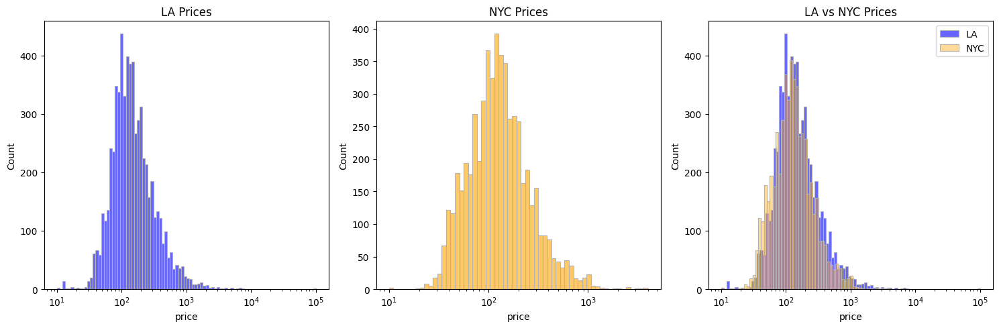

In [ ]:
# # Set up subplots: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.histplot(merged_df_la["price"],
             edgecolor=".7", # give a edge color as .7 to have a clear edge
             linewidth=.8, # give a thin edge
             log_scale=True, # have a better value when there are wide range of data
             ax=axes[0],
             color="blue",
             alpha = 0.6)
axes[0].set_title('LA Prices')

sns.histplot(merged_df_nyc["price"],
             edgecolor=".7",
             linewidth=.8,
             log_scale=True,
             ax=axes[1],
             color = "orange",
             alpha = 0.6)
axes[1].set_title('NYC Prices')

sns.histplot(merged_df_la["price"],
             edgecolor=".7",
             linewidth=.8,
             log_scale=True,
             ax=axes[2],
             color="blue",
             alpha = 0.6,
             label="LA")
sns.histplot(merged_df_nyc["price"],
             edgecolor=".7",
             linewidth=.8,
             log_scale=True,
             ax=axes[2],
             color="orange",
             alpha = 0.4,
             label="NYC")
axes[2].set_title('LA vs NYC Prices')
axes[2].legend()

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

*Figure 7. Price Trends*

Price distribution in Los Angeles (LA): The chart on the left shows that prices in Los Angeles exhibit a clear positive skew (right skewed). Most prices are concentrated between $100 and $1,000, with some extremely high-priced listings (such as rentals over $10,000, or even close to $100,000). The chart indicates that housing prices in Los Angeles are relatively spread out, with a wide range of price fluctuations, especially in the higher-priced segment.

Price distribution in New York City (NYC): The middle chart shows the distribution of Airbnb prices in New York City, which also displays a positive skewed distribution, but the range is more concentrated. Most prices are clustered between $100 and $500, with very few listings exceeding $1,000. Compared to Los Angeles, Airbnb prices in New York lack extreme values in the higher-priced segment, which may be related to the characteristics of the listings in the city. The price distribution in Los Angeles is broader, with a significant number of high-end listings, covering a wide range of prices from economy to ultra-luxury. In contrast, New York’s prices are more concentrated in the mid-to-low price range, with fewer extremely high-priced properties, resulting in a relatively stable market. Los Angeles’ high-end market is more active, likely reflecting the city’s higher proportion of luxury properties and its ability to better meet the demands of high-end tourism.

**c.What is the influencial elements of prices for two cities?(Linear Regression)**

In our analysis of Airbnb prices, we initially used linear regression models to identify the factors influencing prices. We started with a simple linear regression model using the number of accommodations as a predictor.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Define the independent (X) and dependent (y) variables
X = df_la[['accommodates']]  # Predictor (number of people it accommodates)
y = df_la['price']  # Target variable (price of the Airbnb listing)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Fit the model using the training data
model.fit(X_train, y_train)

# Use the model to predict the prices for the test data
y_pred = model.predict(X_test)

# Evaluate the model by calculating the R-squared value
r_squared = model.score(X_test, y_test)

print(f'R²: {r_squared}')  # Displays the R-squared value

R²: 0.25163928497521304


The model’s performance was poor, as indicated by a low  $R^2$  value. We then expanded to a multiple linear regression model by including additional numerical features such as host response rate, property type, and number of reviews.

In [ ]:
from sklearn.impute import SimpleImputer
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Example: Dropping highly correlated columns (like 'price' itself if it's present in the features)
numerical_features = ['host_response_rate', 'host_is_superhost',
                      'accommodates', 'beds', 'minimum_nights',
                      'maximum_nights', 'minimum_nights_avg_ntm',
                      'has_availability', 'availability_30', 'availability_60',
                      'availability_90', 'availability_365',
                      'number_of_reviews_ltm', 'review_scores_rating',
                      'instant_bookable', 'reviews_per_month',
                      'latitude', 'longitude', 'bathrooms',
                      'average_avaliability']

X = df_la[numerical_features]
y = df_la['price']

# Split and follow the same steps...

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create an imputer to fill NaN values with the mean of each column
imputer = SimpleImputer(strategy='mean')

# Fit the imputer on the training data and transform both training and testing data
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions and evaluate the model
y_pred = model.predict(X_test)
r_squared = model.score(X_test, y_test)
print(f'R²: {r_squared}')

R²: 0.35672346542332023


However, even with multiple variables, the performance of the regression model remained unsatisfactory, suggesting that linear regression might not be suitable for capturing the complexities of the data. As a result, we decided to switch to a decision tree model, which is better suited for capturing non-linear relationships and interactions between variables.

**d. What is the influencial elements of prices for two cities? Are there any difference? (Decision Tree)**

In [ ]:
# create datasets for analysis about variables
# LA
merged_df_la_lm = merged_df_la.drop(columns=['id','host_id','host_name','host_neighbourhood','neighbourhood_cleansed','property_type','bathrooms_text', 'amenities','latitude', 'longitude'])
merged_df_la_lm = pd.get_dummies(merged_df_la_lm)

#NYC
merged_df_nyc_lm = merged_df_nyc.drop(columns=['id','host_id','host_name','host_neighbourhood','neighbourhood_cleansed','property_type','bathrooms_text', 'amenities','latitude', 'longitude'])
merged_df_nyc_lm = pd.get_dummies(merged_df_nyc_lm)

In [ ]:
# Determine elements that influcening price using decision tree.
# Prepare x and y for LA and NYC
x_la =merged_df_la_lm.drop(columns=['price'])
y_la = merged_df_la_lm['price']
x_nyc =merged_df_nyc_lm.drop(columns=['price'])
y_nyc = merged_df_nyc_lm['price']

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
# Make a model of the Decision Tree for LA
dt_la = DecisionTreeClassifier(max_depth=4)
dt_la.fit(x_la, y_la)

# Do the same as LA
dt_nyc = DecisionTreeClassifier(max_depth=4)
dt_nyc.fit(x_nyc, y_nyc)


DecisionTreeClassifier(max_depth=4)

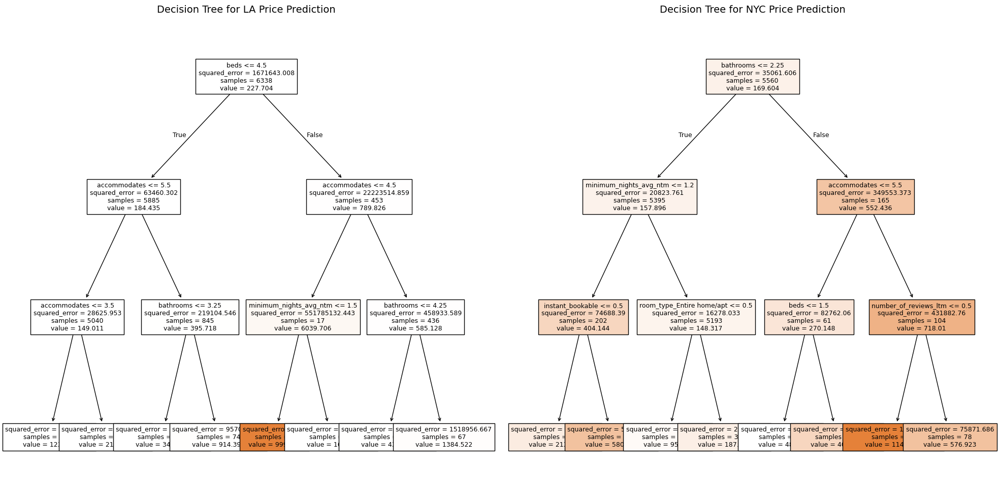

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree

# Assuming merged_df_la_lm and merged_df_nyc_lm are your DataFrames

# Prepare LA data for price prediction
x_la = pd.get_dummies(merged_df_la_lm.drop(columns=['price']), drop_first=True)  # Replace 'price' with the actual price column name
y_la = merged_df_la_lm['price']  # Replace 'price' with the actual price column name

# Prepare NYC data for price prediction
x_nyc = pd.get_dummies(merged_df_nyc_lm.drop(columns=['price']), drop_first=True)  # Replace 'price' with the actual price column name
y_nyc = merged_df_nyc_lm['price']  # Replace 'price' with the actual price column name

# Create and fit the Decision Tree model for LA
dt_la = DecisionTreeRegressor(max_depth=3, random_state=42)  # Use DecisionTreeRegressor for price prediction
dt_la.fit(x_la, y_la)

# Create and fit the Decision Tree model for NYC
dt_nyc = DecisionTreeRegressor(max_depth=3, random_state=42)  # Use DecisionTreeRegressor for price prediction
dt_nyc.fit(x_nyc, y_nyc)

# Set up the plotting area: 1 row, 2 columns
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot the LA decision tree
plot_tree(dt_la, feature_names=x_la.columns, filled=True, ax=axes[0], fontsize=9)
axes[0].set_title('Decision Tree for LA Price Prediction', fontsize=14)

# Plot the NYC decision tree
plot_tree(dt_nyc, feature_names=x_nyc.columns, filled=True, ax=axes[1], fontsize=9)
axes[1].set_title('Decision Tree for NYC Price Prediction', fontsize=14)

# Show the plots
plt.tight_layout()
plt.show()



In [ ]:
# Calculate feature importances for LA
importances_la = dt_la.feature_importances_

# Create a DataFrame to display feature importances for LA
feature_importances_la = pd.DataFrame({'Feature': x_la.columns, 'Importance': importances_la})
feature_importances_la = feature_importances_la.sort_values(by='Importance', ascending=False)

# Print the feature importances for LA
print("Feature Importances for LA:")
print(feature_importances_la)

# Calculate feature importances for NYC
importances_nyc = dt_nyc.feature_importances_

# Create a DataFrame to display feature importances for NYC
feature_importances_nyc = pd.DataFrame({'Feature': x_nyc.columns, 'Importance': importances_nyc})
feature_importances_nyc = feature_importances_nyc.sort_values(by='Importance', ascending=False)

# Print the feature importances for NYC
print("\nFeature Importances for NYC:")
print(feature_importances_nyc)

Feature Importances for LA:
                                  Feature  Importance
6                  minimum_nights_avg_ntm    0.924501
2                            accommodates    0.053169
3                                    beds    0.015194
16                              bathrooms    0.007136
0                      host_response_rate    0.000000
15                      reviews_per_month    0.000000
25                  room_type_Shared room    0.000000
24                 room_type_Private room    0.000000
23                   room_type_Hotel room    0.000000
22              room_type_Entire home/apt    0.000000
21      host_response_time_within an hour    0.000000
20  host_response_time_within a few hours    0.000000
19        host_response_time_within a day    0.000000
18  host_response_time_a few days or more    0.000000
17                   average_avaliability    0.000000
13                   review_scores_rating    0.000000
14                       instant_bookable    0.000000


<ipython-input-34-ae6383a0754c>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=top_features_la, palette='viridis', ax=axes[0])
<ipython-input-34-ae6383a0754c>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=top_features_nyc, palette='viridis', ax=axes[1])


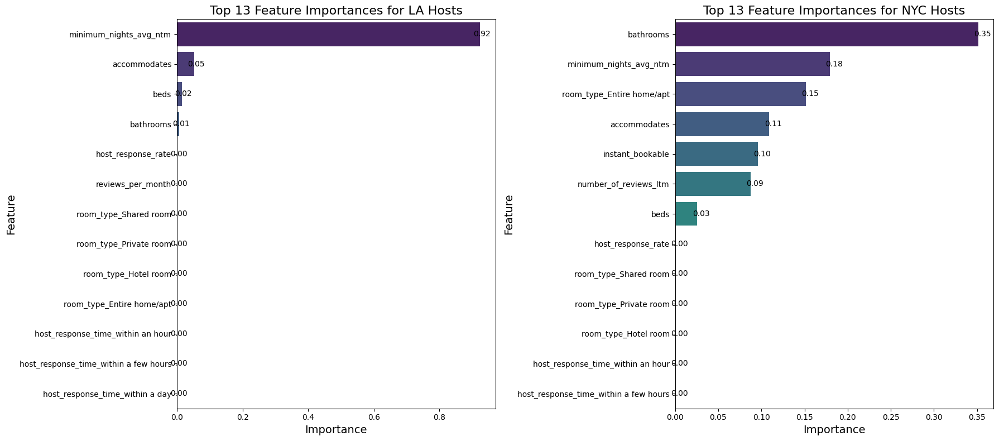

In [ ]:
# LA Dataset
importances_la = dt_la.feature_importances_
feature_importances_la = pd.DataFrame({'Feature': x_la.columns, 'Importance': importances_la})
feature_importances_la = feature_importances_la.sort_values(by='Importance', ascending=False)
top_n = 13
top_features_la = feature_importances_la.head(top_n)

# NYC Dataset
importances_nyc = dt_nyc.feature_importances_
feature_importances_nyc = pd.DataFrame({'Feature': x_nyc.columns, 'Importance': importances_nyc})
feature_importances_nyc = feature_importances_nyc.sort_values(by='Importance', ascending=False)
top_features_nyc = feature_importances_nyc.head(top_n)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot LA
sns.barplot(x='Importance', y='Feature', data=top_features_la, palette='viridis', ax=axes[0])
axes[0].set_title(f'Top {top_n} Feature Importances for LA Hosts', fontsize=16)
axes[0].set_xlabel('Importance', fontsize=14)
axes[0].set_ylabel('Feature', fontsize=14)

# Add values to LA plot
for index, value in enumerate(top_features_la['Importance']):
    axes[0].text(value + 0.005, index, f'{value:.2f}', ha='center', va='center')

# Plot NYC
sns.barplot(x='Importance', y='Feature', data=top_features_nyc, palette='viridis', ax=axes[1])
axes[1].set_title(f'Top {top_n} Feature Importances for NYC Hosts', fontsize=16)
axes[1].set_xlabel('Importance', fontsize=14)
axes[1].set_ylabel('Feature', fontsize=14)

# Add values to NYC plot
for index, value in enumerate(top_features_nyc['Importance']):
    axes[1].text(value + 0.005, index, f'{value:.2f}', ha='center', va='center')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

*Figure 8. Decision Tree Visualization of Super Host*

Based on the decision tree feature importance results, the variables affecting price for both Los Angeles (LA) and New York City (NYC) vary in significance. In LA, there are four major influencial features: "minimum_nights"(0.924501), "accomodates"(0.053169), "beds"(0.015194), and "bathrooms"(0.007136). In particular, it is surprise that "minimum_nights" has a dominant influence towards price in LA, which means airbhb prices in LA really cares about the availability of minimum_nights.

On the other hand, in NYC, the most important variables include "bathrooms"(0.351310), "minimum_nights_avg_ntm"(0.179380),
"room_type_Entire home/apt"(0.151545),"accommodates"(0.108711),
"instant_bookable"(0.096025),"number_of_reviews_ltm"(0.087545),
and "beds" (0.025483). In NYC case, the impact is not a single absolute from one variable, but from multiple variables, which mean airbnb price in NYC think about more facets and take more into account.

In summary, in order to achieve better profits, LA hosts should focus on the availability of minimum_nights, while NYC hosts should consider more like bathrooms and minimum_nights. LA’s price is influenced more by availablities, whereas NYC’s price is driven more by amentities and room types.

### **Q5 Super_host Analysis**
Price analysis definitely helps customers to make better choices. Nevertheless, what can be done for Airbnb? The super_host Analysis. There are strict regulations to select super_host in Airbnb, but is there any difference of criteria in different cities? What kind of hosts can be selected as superhosts?

**a. The super_host fraction**

<ipython-input-35-dd25257fbb67>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  x = sns.catplot(x="host_is_superhost", kind="count", data=df_la, palette="pastel")
<ipython-input-35-dd25257fbb67>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.catplot(x="host_is_superhost", kind="count", data=df_nyc, palette="pastel")


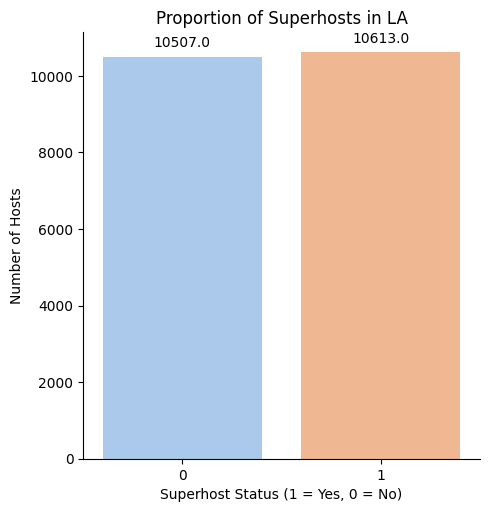

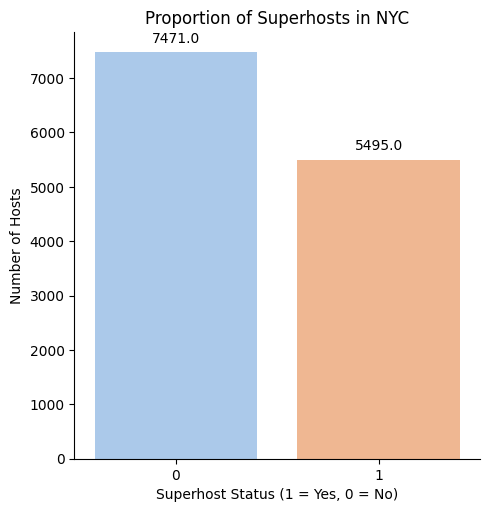

In [ ]:
# Create the plot for LA super_host vs host
x = sns.catplot(x="host_is_superhost", kind="count", data=df_la, palette="pastel")
plt.title("Proportion of Superhosts in LA")
plt.xlabel("Superhost Status (1 = Yes, 0 = No)")
plt.ylabel("Number of Hosts")

# Add counts to LA bars
for p in x.axes[0, 0].patches:
    x.axes[0, 0].annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Create the plot for NYC super_host vs host
ax = sns.catplot(x="host_is_superhost", kind="count", data=df_nyc, palette="pastel")
plt.title("Proportion of Superhosts in NYC")
plt.xlabel("Superhost Status (1 = Yes, 0 = No)")
plt.ylabel("Number of Hosts")

# Add counts to NYC bars
for p in ax.axes[0, 0].patches:
    ax.axes[0, 0].annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()

plt.show()

*Figure 9. Proportion of Superhosts*

According to the graph above, there are dfferences between the proportion of super_host in two regions. For LA, super hosts are more than ordinary hosts, but the difference is only about 100. However, for NYC, super hosts are obviously fewer than ordinary hosts. This might because of stricter regulations and criterias or property type difference.  

**b. Variables influcening Super_host? Any difference between 2 cities?**

<ipython-input-46-8b825eeedd15>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_la = cm.get_cmap('Set3', len(labels_la))(range(len(labels_la)))  # Using Set3 colormap
<ipython-input-46-8b825eeedd15>:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_nyc = cm.get_cmap('Set3', len(labels_nyc))(range(len(labels_nyc)))  # Using Set2 colormap


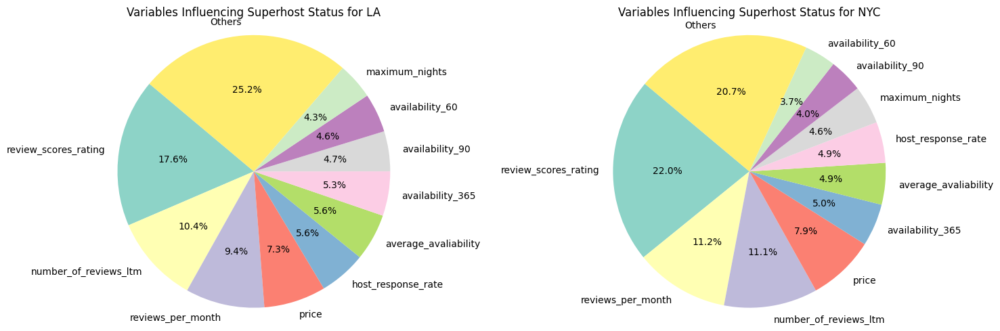

In [ ]:
import matplotlib.cm as cm
from sklearn.ensemble import RandomForestClassifier

# Prepare x and y for LA data
Xla = merged_df_la_lm.drop(columns=['host_is_superhost'])
yla = merged_df_la_lm['host_is_superhost']

# Change categorical variables into dummy variables
Xla = pd.get_dummies(Xla, drop_first=True)

# Make a model of a RandomForestClassifier for LA
rf_clf_la = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_la.fit(Xla, yla)

# Get feature importances for LA
importances_la = rf_clf_la.feature_importances_
feature_names_la = Xla.columns

# Create a DataFrame of the importance values
importance_df_la = pd.DataFrame({'Feature_la': feature_names_la, 'Importance_la': importances_la})
importance_df_la = importance_df_la.sort_values(by='Importance_la', ascending=False)

# Select the top 10 variables and set up other variables as "Others"
top_10_la = importance_df_la.head(10)
other_importance_la = importance_df_la.iloc[10:]['Importance_la'].sum()
pie_data_la = pd.concat([top_10_la, pd.DataFrame({'Feature_la': ['Others'], 'Importance_la': [other_importance_la]})])

# For NYC, repeat the same steps as LA
Xnyc = merged_df_nyc_lm.drop(columns=['host_is_superhost'])
ynyc = merged_df_nyc_lm['host_is_superhost']

Xnyc = pd.get_dummies(Xnyc, drop_first=True)

rf_clf_nyc = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_nyc.fit(Xnyc, ynyc)

importances_nyc = rf_clf_nyc.feature_importances_
feature_names_nyc = Xnyc.columns

importance_df_nyc = pd.DataFrame({'Feature_nyc': feature_names_nyc, 'Importance_nyc': importances_nyc})
importance_df_nyc = importance_df_nyc.sort_values(by='Importance_nyc', ascending=False)

top_10_nyc = importance_df_nyc.head(10)
other_importance_nyc = importance_df_nyc.iloc[10:]['Importance_nyc'].sum()
pie_data_nyc = pd.concat([top_10_nyc, pd.DataFrame({'Feature_nyc': ['Others'], 'Importance_nyc': [other_importance_nyc]})])

# Set up subplots: 1 row, 2 columns
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Create the pie chart for LA
labels_la = pie_data_la['Feature_la']
sizes_la = pie_data_la['Importance_la']
colors_la = cm.get_cmap('Set3', len(labels_la))(range(len(labels_la)))

wedges_la, texts_la, autotexts_la = axes[0].pie(sizes_la, labels=labels_la, autopct='%1.1f%%', startangle=140, colors=colors_la)
axes[0].set_title('Variables Influencing Superhost Status for LA')
axes[0].axis('equal')

# Create the pie chart for NYC
labels_nyc = pie_data_nyc['Feature_nyc']
sizes_nyc = pie_data_nyc['Importance_nyc']
colors_nyc = cm.get_cmap('Set3', len(labels_nyc))(range(len(labels_nyc)))

wedges_nyc, texts_nyc, autotexts_nyc = axes[1].pie(sizes_nyc, labels=labels_nyc, autopct='%1.1f%%', startangle=140, colors=colors_nyc)
axes[1].set_title('Variables Influencing Superhost Status for NYC')
axes[1].axis('equal')

# Adjust label rotation to horizontal
for text in texts_la + texts_nyc:  # Combine LA and NYC labels for processing
    text.set_rotation(0)  # Set rotation to 0 degrees (horizontal)

# Adjust layout
plt.tight_layout()
plt.show()


*Figure 10. Variables Influencing Superhost Status*

According to the pie chart, the impact of the variables on Superhost status decreases from top to bottom on the left side, with the variables at the top having a greater influence. While the ten variables for LA and NYC are the same, they are presented in a different order. The top 4 variables (review scores rating, number of reviews in the last 12 months, reviews per month, and price) are consistently very important for both regions. Based on the review scores rating, LA has a score of over 0.175, whereas NYC exceeds 0.2.

This difference could be tied to the competitive nature of the NYC market and the stricter regulations on short-term rentals, which may push hosts to focus on delivering high-quality service to maintain Superhost status. In contrast, LA’s broader market with more varied property types may allow hosts greater flexibility in other areas like availability or price. This suggests that review scores rating has a smaller influence in LA compared to NYC, while the remaining variables in LA exhibit a more balanced level of influence compared to NYC. To achieve higher Superhost status, hosts in LA need to perform well across multiple aspects. On the other hand, hosts in New York should prioritize improving their review scores rating, as this factor is particularly significant for them.

### **Q6 Type Distribution Analysis**
As one of the influencial variables for super_host distribution disperity, is there any difference on property type distribution and room type distribution?

**a. Property Type Comparison**

In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, CategoricalColorMapper, WMTSTileSource
from bokeh.palettes import Category10
from bokeh.layouts import gridplot

# Display plots in the notebook
output_notebook()

# Prepare data for LA
la_data = merged_df_la[['latitude', 'longitude', 'property_type']]

# The types are too many to show in the graph, using this to separate them into several big types
def categorize_property_type(property_type):
    property_type = str(property_type).lower()
    if 'private' in property_type or 'room' in property_type:
        return 'private'
    elif 'entire' in property_type or 'home' in property_type or 'apartment' in property_type:
        return 'entire'
    elif 'shared' in property_type:
        return 'shared'
    else:
        return 'other'

# Categorize property types for LA
la_data['property_type_category'] = la_data['property_type'].apply(categorize_property_type)

# Prepare data for NYC
nyc_data = merged_df_nyc[['latitude', 'longitude', 'property_type']]
nyc_data['property_type_category'] = nyc_data['property_type'].apply(categorize_property_type)

# Create a unified list of property type categories for both LA and NYC
all_property_types = sorted(set(la_data['property_type_category'].unique()) | set(nyc_data['property_type_category'].unique()))

# Convert to Web Mercator coordinates (from ChatGPT)
def wgs84_to_web_mercator(df, lon="longitude", lat="latitude"):
    k = 6378137
    df["x"] = df[lon] * (k * np.pi / 180.0)
    df["y"] = np.log(np.tan((90 + df[lat]) * np.pi / 360.0)) * k
    return df

la_data = wgs84_to_web_mercator(la_data)
nyc_data = wgs84_to_web_mercator(nyc_data)

# Create ColumnDataSource for LA and NYC
source_la = ColumnDataSource(data=la_data)
source_nyc = ColumnDataSource(data=nyc_data)

# Define color mapper for both LA and NYC using the unified property type list
color_mapper = CategoricalColorMapper(factors=all_property_types, palette=Category10[len(all_property_types)])

# Use WMTSTileSource for tiles (alternative to CARTODBPOSITRON)
tile_source = WMTSTileSource(url="http://tile.stamen.com/terrain/{Z}/{X}/{Y}.png")

# Create figure for LA
p_la = figure(title="LA Airbnb Property Types", x_axis_type="mercator", y_axis_type="mercator",
              tools="pan,wheel_zoom,box_zoom,reset,save")
p_la.add_tile(tile_source)

# Add circle glyphs for property locations for LA
for property_type in all_property_types:
    subset = la_data[la_data['property_type_category'] == property_type]
    source_subset = ColumnDataSource(data=subset)
    p_la.circle(x='x', y='y', source=source_subset, size=8,
                color=color_mapper.palette[all_property_types.index(property_type)],  # Use the color from the palette
                fill_alpha=0.2, line_alpha=0.6, legend_label=property_type,  # Use legend_label only
                muted_alpha=0.1)

# Set the legend position and orientation for LA
p_la.legend.location = "bottom_right"
p_la.legend.orientation = "horizontal"

# Create figure for NYC
p_nyc = figure(title="NYC Airbnb Property Types", x_axis_type="mercator", y_axis_type="mercator",
               tools="pan,wheel_zoom,box_zoom,reset,save")
p_nyc.add_tile(tile_source)

# Add circle glyphs for property locations for NYC
for property_type in all_property_types:
    subset = nyc_data[nyc_data['property_type_category'] == property_type]
    source_subset = ColumnDataSource(data=subset)
    p_nyc.circle(x='x', y='y', source=source_subset, size=8,
                 color=color_mapper.palette[all_property_types.index(property_type)],
                 fill_alpha=0.2, line_alpha=0.6, legend_label=property_type,
                 muted_alpha=0.1)

# Set the legend position and orientation for NYC
p_nyc.legend.location = "bottom_right"
p_nyc.legend.orientation = "horizontal"

# Arrange the two plots in a grid
grid = gridplot([[p_la, p_nyc]])

# Show the combined plot
show(grid)


<ipython-input-47-20d72aa6c96d>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  la_data['property_type_category'] = la_data['property_type'].apply(categorize_property_type)
<ipython-input-47-20d72aa6c96d>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nyc_data['property_type_category'] = nyc_data['property_type'].apply(categorize_property_type)
<ipython-input-47-20d72aa6c96d>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

*Figure 11. Property Type Distribution*

According to the graph above, there is a clear comparsion of property type distribution in two cities. In both cities, private property type should be the majority, and entire property type rank second in both cities. In addition, other only counts as very small proportion in both cities. In LA, Shoreline Shores and Long Beach are popular areas. In NYC, Brooklyn and Manhattan, then Queens. However, there is a difference between two cities. The distribuion of all the types will be wider in LA than in NYC. LA's listings has less density, but NYC shows obvious clustering.

**b. Room Type Comparison**

Hotel listings are the most expensive for NYC and shared rooms are the cheapest.
The trend in LA is different, where entire home/apartment rentals have the highest prices, while shared rooms remain affordable across both cities

In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, CategoricalColorMapper, WMTSTileSource
from bokeh.palettes import Category10
from bokeh.layouts import gridplot

# Display plots in the notebook
output_notebook()

# The types are too many to show in the graph, using this to separate them into several big types
def categorize_room_type(room_type):
    room_type = room_type.lower()
    if 'entire' in room_type:
        return 'Entire Home/Apt'
    elif 'private' in room_type:
        return 'Private Room'
    elif 'shared' in room_type:
        return 'Shared Room'
    else:
        return 'Other'

# Prepare LA data
la_data = merged_df_la[['latitude', 'longitude', 'room_type']].copy()
la_data['room_type'] = la_data['room_type'].apply(categorize_room_type)
la_data = wgs84_to_web_mercator(la_data)

# Prepare NYC data
nyc_data = merged_df_nyc[['latitude', 'longitude', 'room_type']].copy()
nyc_data['room_type'] = nyc_data['room_type'].apply(categorize_room_type)
nyc_data = wgs84_to_web_mercator(nyc_data)

# Create a unified and sorted list of room types for both LA and NYC
all_room_types = sorted(set(la_data['room_type'].unique()) | set(nyc_data['room_type'].unique()))

# Create ColumnDataSource for LA and NYC
source_la = ColumnDataSource(data=la_data)
source_nyc = ColumnDataSource(data=nyc_data)

# Define color mapper for both LA and NYC using the unified room types list
color_mapper = CategoricalColorMapper(factors=all_room_types, palette=Category10[len(all_room_types)])

# Use WMTSTileSource for map tiles (replaces CARTODBPOSITRON)
tile_url = "http://tile.stamen.com/terrain/{Z}/{X}/{Y}.png"
tile_source = WMTSTileSource(url=tile_url)

# Create figure for LA
p_la = figure(title="LA Airbnb Room Types",
              x_axis_type="mercator", y_axis_type="mercator",
              tools="pan,wheel_zoom,box_zoom,reset,save")
p_la.add_tile(tile_source)

# Add circle glyphs for LA
p_la.circle(x='x', y='y', source=source_la, size=8,
            color={'field': 'room_type', 'transform': color_mapper},
            fill_alpha=0.2, line_alpha=0.6, legend_field='room_type', muted_alpha=0.1)

# Set the legend position and orientation for LA
p_la.legend.location = "bottom_right"
p_la.legend.orientation = "horizontal"

# Create figure for NYC
p_nyc = figure(title="NYC Airbnb Room Types",
               x_axis_type="mercator", y_axis_type="mercator",
               tools="pan,wheel_zoom,box_zoom,reset,save")
p_nyc.add_tile(tile_source)

# Add circle glyphs for NYC
p_nyc.circle(x='x', y='y', source=source_nyc, size=8,
             color={'field': 'room_type', 'transform': color_mapper},
             fill_alpha=0.2, line_alpha=0.6, legend_field='room_type', muted_alpha=0.1)

# Set the legend position and orientation for NYC
p_nyc.legend.location = "bottom_right"
p_nyc.legend.orientation = "horizontal"

# Arrange the two plots in a grid
grid = gridplot([[p_la, p_nyc]])

# Show the combined plot
show(grid)

*Figure 12. Room Type Distribution*

This visualization shows the geographical distribution of Airbnb room types in Los Angeles (LA) and New York City (NYC). In both cities, Entire Homes/Apartments (blue circles) dominate the market, particularly in central and coastal areas. While Entire Homes/Apartments are also prevalent in NYC, there are more Private Rooms in comparison, especially outside the main tourist hubs.The strong presence of Entire Homes/Apartments in both cities suggests that travelers prioritize privacy and are willing to pay more for full accommodations. In LA, the most concentrated areas for Airbnb listings are the central and western parts, including popular neighborhoods like Santa Monica, Venice Beach, and downtown LA. In NYC, the majority of listings are found in Manhattan and Brooklyn, with fewer available in other boroughs.

### **Q7 Amenities Analysis**
Besides the type distribution difference, is there any difference beween the preference of amenities?

**a.Comparison of Review Scores and Availability**

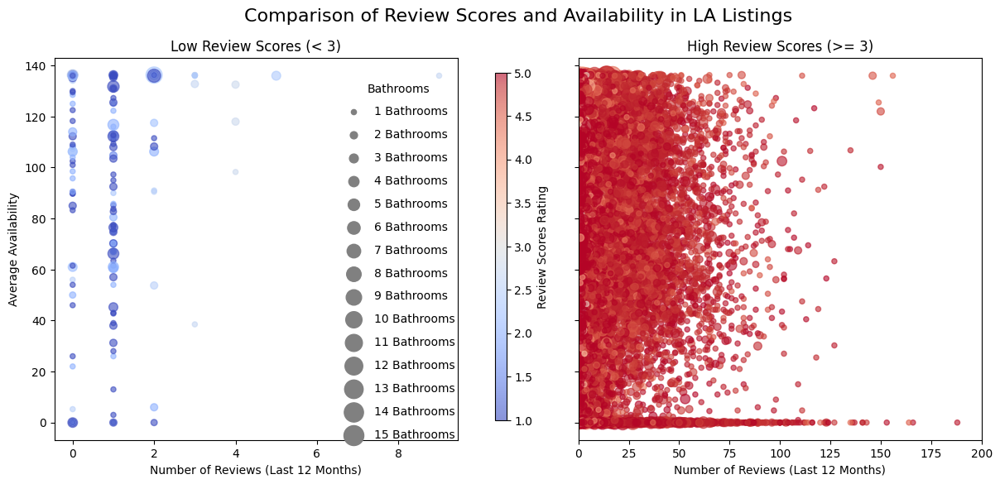

In [ ]:
# Find the minimum and maximum review scores
vmin = df_la['review_scores_rating'].min()
vmax = df_la['review_scores_rating'].max()

# Split the dataset
low_score_df = df_la[df_la['review_scores_rating'] < 3]  # Scores below 3
high_score_df = df_la[df_la['review_scores_rating'] >= 3]  # Scores 3 and above
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)  # 1 row, 2 columns of subplots, shared y-axis

# Plot the first subplot - Scores below 3
scatter1 = axes[0].scatter(low_score_df['number_of_reviews_ltm'], low_score_df['average_avaliability'],
                           s=low_score_df['bathrooms']*20, c=low_score_df['review_scores_rating'],
                           cmap='coolwarm', alpha=0.6, vmin=vmin, vmax=vmax)  # Unified color scale
axes[0].set_title('Low Review Scores (< 3)')
axes[0].set_xlabel('Number of Reviews (Last 12 Months)')
axes[0].set_ylabel('Average Availability')

# Plot the second subplot - Scores 3 and above
scatter2 = axes[1].scatter(high_score_df['number_of_reviews_ltm'], high_score_df['average_avaliability'],
                           s=high_score_df['bathrooms']*20, c=high_score_df['review_scores_rating'],
                           cmap='coolwarm', alpha=0.6, vmin=vmin, vmax=vmax)  # Unified color scale
axes[1].set_title('High Review Scores (>= 3)')
axes[1].set_xlabel('Number of Reviews (Last 12 Months)')
axes[1].set_xlim(0, 200)

# Adjust the subplot spacing to make room for the color bar
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.3)

# Create a new axis in the middle of the two plots for the color bar
cax = fig.add_axes([0.48, 0.15, 0.01, 0.7])  # [left, bottom, width, height]

max_bathrooms = int(df_la['bathrooms'].max())  # Get the maximum number of bathrooms
for size in range(1, max_bathrooms + 1):
    plt.scatter([], [], s=size*20, c='gray', label=f'{size} Bathrooms')  # Legend example for point sizes

plt.legend(scatterpoints=1, frameon=False, labelspacing=1, title='Bathrooms', loc='upper right', bbox_to_anchor=(-2.5, 1))
# Add a shared color bar for the two subplots
cbar = fig.colorbar(scatter2, cax=cax)
cbar.set_label('Review Scores Rating')

fig.suptitle('Comparison of Review Scores and Availability in LA Listings', fontsize=16)
plt.show()

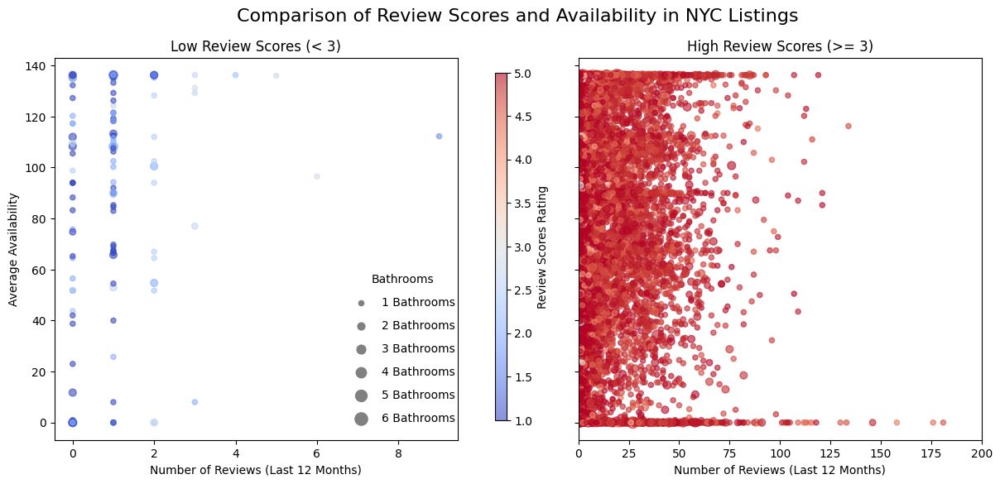

In [ ]:
# Find the minimum and maximum review scores
vmin = df_nyc['review_scores_rating'].min()
vmax = df_nyc['review_scores_rating'].max()

# Split the dataset
low_score_df = df_nyc[df_nyc['review_scores_rating'] < 3]  # Scores below 3
high_score_df = df_nyc[df_nyc['review_scores_rating'] >= 3]  # Scores 3 and above

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)  # 1 row, 2 columns of subplots, shared y-axis

# Plot the first subplot - Scores below 3
scatter1 = axes[0].scatter(low_score_df['number_of_reviews_ltm'], low_score_df['average_avaliability'],
                           s=low_score_df['bathrooms']*20, c=low_score_df['review_scores_rating'],
                           cmap='coolwarm', alpha=0.6, vmin=vmin, vmax=vmax)  # Unified color scale
axes[0].set_title('Low Review Scores (< 3)')
axes[0].set_xlabel('Number of Reviews (Last 12 Months)')
axes[0].set_ylabel('Average Availability')

# Plot the second subplot - Scores 3 and above
scatter2 = axes[1].scatter(high_score_df['number_of_reviews_ltm'], high_score_df['average_avaliability'],
                           s=high_score_df['bathrooms']*20, c=high_score_df['review_scores_rating'],
                           cmap='coolwarm', alpha=0.6, vmin=vmin, vmax=vmax)  # Unified color scale
axes[1].set_title('High Review Scores (>= 3)')
axes[1].set_xlabel('Number of Reviews (Last 12 Months)')
axes[1].set_xlim(0, 200)

# Adjust the subplot spacing to make room for the color bar
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.3)

# Create a new axis in the middle of the two plots for the color bar
cax = fig.add_axes([0.48, 0.15, 0.01, 0.7])  # [left, bottom, width, height]

# Add a shared color bar for the two subplots
cbar = fig.colorbar(scatter2, cax=cax)
cbar.set_label('Review Scores Rating')

# Create a legend showing the meaning of point sizes representing bathrooms
max_bathrooms = int(df_nyc['bathrooms'].max())  # Get the maximum number of bathrooms
for size in range(1, max_bathrooms + 1):
    plt.scatter([], [], s=size*20, c='gray', label=f'{size} Bathrooms')  # Legend example for point sizes

plt.legend(scatterpoints=1, frameon=False, labelspacing=1, title='Bathrooms', loc='upper right', bbox_to_anchor=(-2.5, 0.45))

# Add a main title for the entire figure
fig.suptitle('Comparison of Review Scores and Availability in NYC Listings', fontsize=16)

# Display the plots
plt.show()

*Figure 13. Comparison of Review Scores and Availability*

These two charts show the relationship between number of bathrooms and number of reviews, average availability, and review scores rating in LA and NYC. The charts show that listings with more bathrooms do not necessarily have higher ratings, but are still popular among highly rated listings. This shows that while the number of bathrooms is an important feature of a listing, it is not the only factor that affects ratings. Highly rated listings have a variety of bathrooms, and these listings are booked more frequently. For hosts, providing more bathrooms can attract more guests, especially for higher-end listings, but other amenities and services are also important to achieve high ratings.

**b. Top 10 Most Common Amentities**

**Most listed Airbnb Amenities**

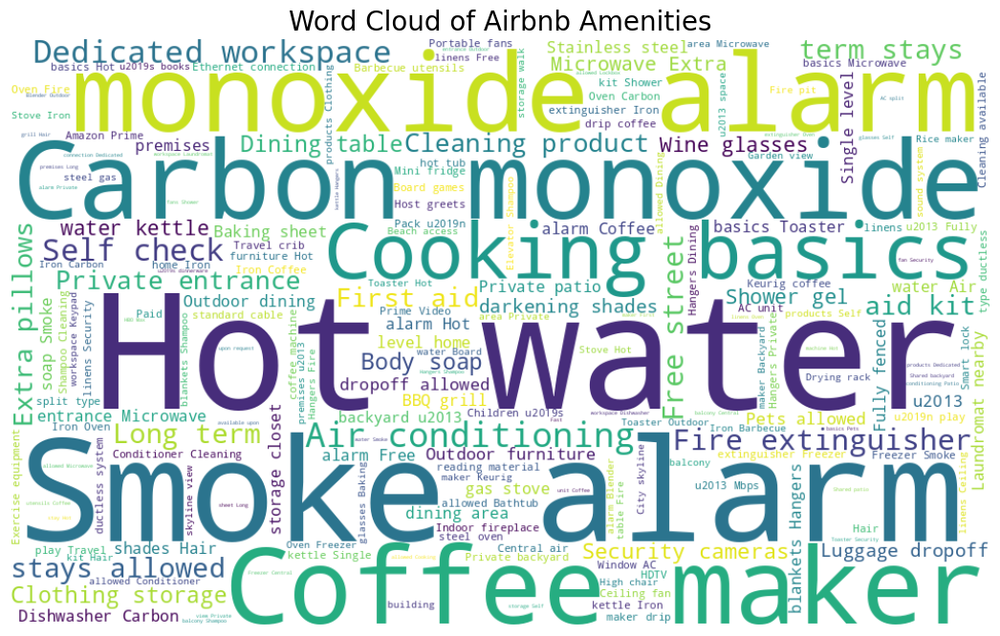

In [ ]:
from wordcloud import WordCloud, STOPWORDS

# Combine all amenities into a single string
all_amenities = ' '.join(df_combined['amenities'].astype(str).tolist())

# Add more words to the stopwords list
stopwords = set(STOPWORDS)
stopwords.update(["property", "room", "kitchen", "wifi", "parking", "essentials", "heating", "dryer", "washer", "air conditioning", "tv", "bedroom", "bed", "bathroom", "refrigerator", "dishes", "silverware", "cooking basics"])

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords=stopwords, max_words=200).generate(all_amenities)  # Adjusted width, height, and max_words

# Display the word cloud
plt.figure(figsize=(15, 8))  # Adjusted figure size
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Airbnb Amenities', fontsize=20)  # Adjusted title fontsize
plt.show()

**Essentials**: Guests prioritize basic amenities like Wifi, kitchen, and essentials.

**Desirable**: Popular amenities include hot tubs, pools, and gyms.

**Location/Comfort**: Guests value outdoor spaces and recreational opportunities.

**Safety**: Safety features like smoke alarms and first aid kits are important.

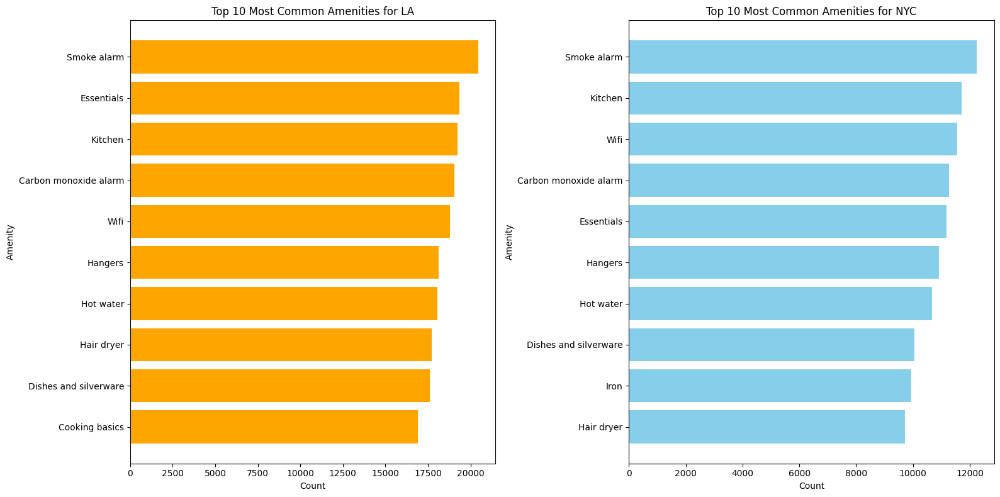

In [ ]:
from collections import Counter

# Process NYC data
df_nyc['amenities'] = df_nyc['amenities'].apply(lambda x: eval(x) if isinstance(x, str) else x)
all_amenities_nyc = df_nyc['amenities'].explode()
amenities_counter_nyc = Counter(all_amenities_nyc)
amenities_df_nyc = pd.DataFrame(amenities_counter_nyc.items(), columns=['Amenity', 'Count']).sort_values(by='Count', ascending=False)
top_10_amenities_nyc = amenities_df_nyc.head(10)

# Process LA data
df_la['amenities'] = df_la['amenities'].apply(lambda x: eval(x) if isinstance(x, str) else x)
all_amenities_la = df_la['amenities'].explode()
amenities_counter_la = Counter(all_amenities_la)
amenities_df_la = pd.DataFrame(amenities_counter_la.items(), columns=['Amenity', 'Count']).sort_values(by='Count', ascending=False)
top_10_amenities_la = amenities_df_la.head(10)

# Create subplot layout, 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot LA chart
axes[0].barh(top_10_amenities_la['Amenity'], top_10_amenities_la['Count'], color='orange')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Amenity')
axes[0].set_title('Top 10 Most Common Amenities for LA')
axes[0].invert_yaxis()  # Invert y-axis to display most frequent amenities at the top

# Plot NYC chart
axes[1].barh(top_10_amenities_nyc['Amenity'], top_10_amenities_nyc['Count'], color='skyblue')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('Amenity')
axes[1].set_title('Top 10 Most Common Amenities for NYC')
axes[1].invert_yaxis()  # Invert y-axis to display most frequent amenities at the top

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

*Figure 14. Top 10 Most Common Amenities*


This chart compares the top 10 most common amenities for listings in NYC and LA. Both cities prioritize safety features such as smoke alarms and carbon monoxide alarms, as well as essential conveniences like kitchens, wifi, and basic household items. However, LA listings show a slightly higher emphasis on cooking-related amenities like “Cooking basics,” suggesting that LA hosts may cater more to guests who plan to cook during their stay. In contrast, NYC listings focus more on practical amenities for shorter stays, such as “WiFi,” “Dishes and silverware,” and “Hair dryer,” which are essential for quick, convenient living rather than extended stays.

**c. Room Types and Amenities**

<ipython-input-53-4d1a68d5f3aa>:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_amenities_by_room_nyc = amenities_count_by_room_nyc.groupby('room_type').apply(lambda x: x.nlargest(5, 'Count')).reset_index(drop=True)
<ipython-input-53-4d1a68d5f3aa>:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_amenities_by_room_la = amenities_count_by_room_la.groupby('room_type').apply(lambda x: x.nlargest(5, 'C

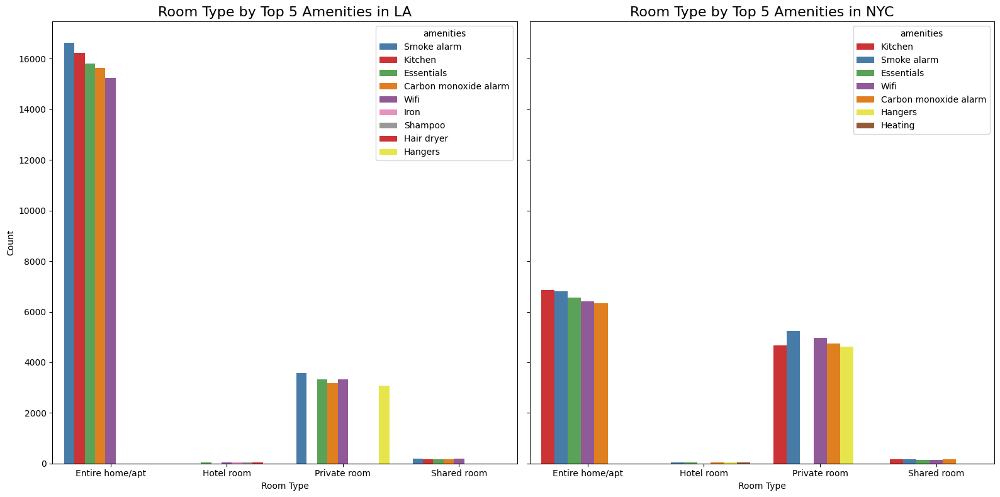

In [ ]:
from collections import Counter

# NYC part
# If amenities are stored as string lists, convert them into actual Python lists
df_nyc['amenities'] = df_nyc['amenities'].apply(lambda x: eval(x) if isinstance(x, str) else x)
df_nyc_exploded = df_nyc.explode('amenities')
amenities_count_by_room_nyc = df_nyc_exploded.groupby(['room_type', 'amenities']).size().reset_index(name='Count')
top_amenities_by_room_nyc = amenities_count_by_room_nyc.groupby('room_type').apply(lambda x: x.nlargest(5, 'Count')).reset_index(drop=True)

# LA part
# If amenities are stored as string lists, convert them into actual Python lists
df_la['amenities'] = df_la['amenities'].apply(lambda x: eval(x) if isinstance(x, str) else x)
df_la_exploded = df_la.explode('amenities')
amenities_count_by_room_la = df_la_exploded.groupby(['room_type', 'amenities']).size().reset_index(name='Count')
top_amenities_by_room_la = amenities_count_by_room_la.groupby('room_type').apply(lambda x: x.nlargest(5, 'Count')).reset_index(drop=True)

# Combine amenities from both NYC and LA to ensure a unified color mapping
all_amenities = pd.concat([top_amenities_by_room_nyc['amenities'], top_amenities_by_room_la['amenities']]).unique()

# Create a color palette based on the combined list of amenities
palette = sns.color_palette('Set1', len(all_amenities))
amenities_palette = dict(zip(all_amenities, palette))

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Plot the LA chart
sns.barplot(x='room_type', y='Count', hue='amenities', data=top_amenities_by_room_la, palette=amenities_palette, ax=axes[0])
axes[0].set_title('Room Type by Top 5 Amenities in LA', fontsize=16)
axes[0].set_xlabel('Room Type')
axes[0].set_ylabel('Count')

# Plot the NYC chart
sns.barplot(x='room_type', y='Count', hue='amenities', data=top_amenities_by_room_nyc, palette=amenities_palette, ax=axes[1])
axes[1].set_title('Room Type by Top 5 Amenities in NYC', fontsize=16)
axes[1].set_xlabel('Room Type')


plt.tight_layout()
plt.show()

*Figure 15. Room Types by Top 5 Amenities*

LA Room Type and Amenities Analysis:

In LA, all room types—entire homes/apartments, private rooms, hotel rooms, and shared rooms—have varying levels of demand for certain amenities. Entire homes/apartments consistently provide the most sought-after amenities, such as smoke alarms, kitchens, essentials, carbon monoxide alarms, and wifi. These are must-have features for guests expecting comfort, safety, and convenience during their stay. For private rooms, the demand for practical amenities like hangers, hair dryers, and wifi is also high, ensuring guests have the essentials needed for shorter stays. Even in hotel rooms and shared rooms, although less common, basic safety features like smoke alarms and carbon monoxide alarms are still prioritized, along with wifi for connectivity.

Host Recommendation for LA: To maximize appeal across all room types, hosts should ensure that entire homes/apartments are equipped with kitchens, essentials, and wifi, as well as critical safety measures like smoke alarms. For private rooms, including hangers, hair dryers, and wifi can make these spaces more attractive to guests looking for short-term stays. Even hotel rooms and shared rooms should maintain key safety features and offer wifi to remain competitive, ensuring basic comfort for guests.

NYC Room Type and Amenities Analysis:

In NYC, the demand for amenities is similar across different room types—entire homes/apartments, private rooms, hotel rooms, and shared rooms—but with a few unique characteristics. Entire homes/apartments tend to offer core amenities such as kitchens, wifi, smoke alarms, carbon monoxide alarms, and essentials, which cater to guests seeking a fully equipped living space. Private rooms in NYC show a high demand for hangers, heating, and wifi, indicating that practical and climate-based amenities are crucial, especially in colder months. For hotel rooms and shared rooms, while less prevalent, safety features like smoke alarms and basic amenities like wifi are still expected, ensuring a minimum level of comfort for guests.

Host Recommendation for NYC: To attract more bookings, entire homes/apartments should offer a fully equipped kitchen, wifi, and safety essentials such as smoke alarms and carbon monoxide alarms. For private rooms, it’s important to provide heating, hangers, and wifi to meet guest expectations, especially during colder seasons. Even for hotel rooms and shared rooms, having smoke alarms and wifi ensures these room types remain safe and convenient for guests. By focusing on these amenities across all room types, hosts can better meet guest demands and enhance the attractiveness of their listings.

## **6 Conclusion**


The whole project aims to discover the different price patterns between two major cities (LA and NYC), identify influential indicators for super hosts in the two cities, and make comparisons on room types and property types in the two regions. After exploring the data, there are some insights shown:


Los Angeles (LA) and New York City (NYC) dominate the US Airbnb market. LA consistently has more bookings, likely due to diverse property types and fewer rental restrictions. Both cities saw booking growth from 2014–2022, with a dip in 2020 due to the pandemic. LA has a wider price range, including luxury properties, while NYC's prices are more concentrated. Price heatmaps reflect these trends. Wifi, kitchens, and air conditioning are the most listed amenities. These insights inform pricing and property decisions for hosts and travelers in these distinct markets. LA hosts might capitalize on the luxury market, while NYC hosts should focus on competitive pricing and guest experience.


For **Price**: In terms of pricing, Los Angeles (LA) and New York City (NYC) show significant differences. The price range in LA is much broader, reflecting the presence of luxury properties and diverse rental options. The price range in NYC indicates a more concentrated market with fewer high-end listings. Price trends in both cities show a right-skewed distribution, where most properties fall within the lower to mid-price range. Regarding price-influencing factors, in LA, the most influential variables are physical attributes. This suggests that larger properties and full homes play a significant role in price determination. In NYC, operational factors are more important, reflecting the importance of room type and host responsiveness in a more regulated market.


For **Superhost Comparison**: For variables correlated with Super_host in LA and NYC. Compared to NYC, the top variable in LA has a smaller impact, while the remaining variables exhibit a more balanced level of influence. Therefore, hosts in LA need to perform well across multiple aspects, whereas hosts in New York should concentrate on one specific variable, as it holds considerable importance.


For **Type Comparison**: For property type, in both cities, private property type should be the majority, and entire property type ranks second in both cities. The difference is that in LA, listings have less density, but NYC shows obvious clustering. And for room type distribution in both cities, entire homes/apartments dominate the market, particularly in central and coastal areas. However, Entire homes and apartments are more prevalent in NYC. So, in NYC, travelers prioritize privacy and are willing to pay more for full accommodations. In LA, Airbnb listings are mostly distributed in the central and western regions. In NYC, the majority of listings are found in Manhattan and Brooklyn.


For **Amenities**: The analysis of LA and NYC amenities highlights the need to tailor features to guest preferences to maximize occupancy rates. In LA, "Cooking basics," kitchens, and wifi attract guests seeking longer stays and home-like comfort, making these amenities a priority for hosts. In NYC, practical amenities like "Dishes and silverware," "Hair dryers," and "Heating" cater to short-term, transient guests. NYC hosts should focus on these essentials to improve convenience. In both cities, balancing safety features with core conveniences is key to boosting guest satisfaction and occupancy.


However, there are some improvements to refine the project due to time constraints and data limitations.

1. **Outlier Analysis**: There are many outliers contained in the dataset, but we didn't remove them. Some of the results and insights might be influenced because of outliers. Nevertheless, outliers contained in the dataset are mostly about the luxury properties contained in the LA dataset, which is worth having other research based on these outliers.

2. **Host and Property Analysis**: Columns such as `host_location`, `neighbourhood`, and `neighbourhood_group_cleansed` offer detailed host and property location data. Analyzing these could provide insights into how neighborhood popularity and host location impact pricing, bookings, or super host status.

3. **Booking Calendar**: While Booking Calendar Details could be added to our project as well although it's not fully populated. The `calendar_updated` and `calendar_last_scraped` columns provide data freshness indicators that might reflect host engagement, potentially impacting booking consistency and guest satisfaction.

4. **Sub_Scores**: In Review Sub-Scores, several review score metrics (`review_scores_accuracy`, `review_scores_checkin`, etc.) offer detailed feedback beyond the overall rating, revealing specific strengths or weaknesses that may affect bookings and pricing.

Incorporating these variables could yield a richer, more nuanced understanding of Airbnb trends across both cities.

## **7 Challenges**

Although we achieved a lot in this project, there are some limitations due to the datasets and techniques that prevent us from conducting certain analyses:

1. **Data Quality**: The dataset used contains many missing values and duplicates, which could cause the analysis to be biased.

2. **Time Series Analysis**: The LA and NYC datasets do not contain date data, making it impossible to perform a time series analysis. As this is an Airbnb dataset, there are likely seasonal trends worth analyzing. In the future, this could be explored further and would contribute to a long-term project.

3. **Linear Regression for Price Analysis**: In this project, we used simple and multiple linear regression models to identify the influential variables affecting prices. However, neither model performed well during testing. Due to time constraints, we were unable to spend enough time selecting the right variables and finding more appropriate models for price prediction.

4. **Market Comparison Analysis**: Currently, the project focuses only on Airbnb. However, there are many other competitors, such as Booking.com, that may influence price optimization on Airbnb. Expanding the analysis to include other platforms could provide a more comprehensive view.

## **8 References**


1. [Behind NYC’s Tightening Restrictions on Airbnb and Short-Term Rentals](https://chicagopolicyreview.org/2024/01/31/behind-nycs-tightening-restrictions-on-airbnb-and-short-term-rentals/)
2. [Create Dummy Variables in Python with Pandas](https://www.geeksforgeeks.org/how-to-create-dummy-variables-in-python-with-pandas/)
3. [Histogram Stacked](https://seaborn.pydata.org/examples/histogram_stacked.html)
4. [Join Two Tables Together in Python](https://www.google.com/search?q=join+2+tables+together+in+python&oq=join+2+tables+together+in+python&gs_lcrp=EgZjaHJvbWUyBggAEEUYOTIICAEQABgWGB4yCAgCEAAYFhgeMggIAxAAGBYYHjINCAQQABiGAxiABBiKBTINCAUQABiGAxiABBiKBTINCAYQABiGAxiABBiKBTINCAcQABiGAxiABBiKBTIKCAgQABiABBiiBNIBCTEzODMwajBqN6gCALACAA&sourceid=chrome&ie=UTF-8)
5. [Seaborn Barplot](https://seaborn.pydata.org/archive/0.11/generated/seaborn.barplot.html)
6. [Seaborn Color Palettes](https://seaborn.pydata.org/tutorial/color_palettes.html)
7. [Visualize Decision Tree in Python](https://www.google.com/search?q=how+to+do+decision+tree+in+python+with+visualization&sca_esv=9f344bc6aa950c3c&sca_upv=1&ei=1yb2ZtDtPIOkiLMP9OmV2Q4&ved=0ahUKEwiQtdXRl-KIAxUDEmIAHfR0JesQ4dUDCBA&uact=5&oq=how+to+do+decision+tree+in+python+with+visualization&gs_lp=Egxnd3Mtd2l6LXNlcnAiNGhvdyB0byBkbyBkZWNpc2lvbiB0cmVlIGluIHB5dGhvbiB3aXRoIHZpc3VhbGl6YXRpb24yBRAhGKABMgUQIRigATIFECEYoAEyBRAhGKABMgUQIRifBTIFECEYnwVIvTJQqhFYzDBwAXgBkAEAmAFtoAGSDqoBBDE1LjS4AQPIAQD4AQGYAhSgArwOwgIKEAAYsAMY1gQYR8ICBhAAGBYYHsICCxAAGIAEGIYDGIoFwgIIEAAYgAQYogSYAwCIBgGQBgiSBwQxNC42oAfTbQ&sclient=gws-wiz-serp)

## **9 Generative AI Disclosure**


Generative AI Disclosure Statement:


In the execution of this project, we employed generative AI tools to enhance various components of our work. Below is a comprehensive overview of the applications of these tools:


Content Generation: We utilized ChatGPT to generate a broader range of ideas regarding the project's objectives. The AI facilitated the concept of implementing distribution analysis and conducting comparative analysis based on that framework.


Data Cleaning Phase: During the data cleaning process, we leveraged ChatGPT’s recommendations to refine algorithms and rectify potential discrepancies in extracting numerical data from the 'bathrooms_text' column, as well as converting 'host_response_rate' into a numeric format.


Data inquiry: We sought coding suggestions to complete the necessary functions for our analysis. This included debugging and modifying the code when errors were identified, as well as simplifying complex code structures.


Chart Preparation: In the chart preparation phase, we relied on ChatGPT's assistance to adjust various charts based on different attributes and functions and to develop a function that would eliminate the need to rewrite code for other regions.


Grammar Review: We employed both Grammarly and ChatGPT to revise the analysis and conclusion sections, enhancing the language to improve fluency.


Our team has thoroughly reviewed, edited, and validated all content generated by AI to ensure its accuracy, relevance, and originality, in alignment with academic integrity standards.
